# Trabajo de Fin de Máster
## Machine Learning para la detección de exoplanetas: revisión y nuevos enfoques.
### Implementación

# Tabla de contenidos
* [Librerías](#1)
* [Carga de los datos](#2)
    * [Representación gráfica](#2.3)
* [Procesamiento de datos](#3)
    * [1. Abstracción de tendencia](#3.1)
    * [2. Datos atípicos superiores](#3.2)
    * [3. Normalización](#3.3)
* [<i>Data augmentation</i>](#4)
    * [1. Incremento y decremento en varias magnitudes](#4.1)
    * [2. Ruido aleatorio](#4.2)
    * [Aplanamiento superior](#4.3)
* [Clasificación](#5)
    * [Estrategia A - Distribuciones](#5.1)
        * [Generación del nuevo dataset](#5.1.1)
        * [Modelos](#5.1.2)
        * [Resultados](#5.1.3)
    * [Estrategia B - Selección de dimensionalidad](#5.2)
        * [Extracción de posibles tránsitos](#5.2.1)
        * [Distribución de las mediciones y frecuencia de aparición de los posibles tránsitos](#5.2.2)
        * [Modelos](#5.2.3)
        * [Resultados](#5.2.4)
    * [Estrategia C - Mecanismo de atención](#5.3)
        * [Vector atención](#5.3.1)
        * [Estrategia C<sub>A</sub> - Distribuciones con mecanismo de atención](#5.3.2)
            * [Datos](#5.3.2.1)
            * [Modelos](#5.3.2.2)
            * [Resultados](#5.3.2.3)
        * [Estrategia C<sub>B</sub> - Selección de dimensionalidad con mecanismo de atención](#5.3.3)
            * [Datos](#5.3.3.1)
            * [Modelos](#5.3.3.2)
            * [Resultados](#5.3.3.3)
* [Comparación de resultados](#6)
    * [Mejores modelos](#6.1)

# Librerías <a class="anchor" id="1"></a>

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import warnings
import keras
import seaborn as sns
from sklearn.metrics import classification_report,confusion_matrix,plot_confusion_matrix,ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score
from scipy import ndimage
from keras.callbacks import EarlyStopping, ModelCheckpoint
from scipy import stats
from keras import backend as K
from keras.models import Sequential, Model
from keras.layers import Dense
from tensorflow.keras.optimizers import Adam, SGD, Adadelta, Adagrad
from sklearn.metrics import confusion_matrix, mean_squared_error, classification_report
from sklearn import preprocessing
warnings.filterwarnings("ignore")
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Carga de los datos <a class="anchor" id="2"></a>

##### Datos de entrenamiento <a class="anchor" id="2.1"></a>

In [2]:
# Cargar archivo .csv
kepler_train_data_csv = pd.read_csv("exoTrain.csv")

# Construir DataFrame
train_df = pd.DataFrame(kepler_train_data_csv)

# Cambiar los valores de las etiquetas: estrellas con exoplanteas = 1; estrellas sin exoplanetas = 0
train_df['LABEL'] = train_df['LABEL'].replace([2, 1], [1, 0])

# Construir array de datos y de etiquetas
train = np.array(train_df.drop('LABEL', axis = 1))
train_labels = np.array(train_df['LABEL'])

train_df

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,1,93.85,83.81,20.10,-26.98,-39.56,-124.71,-135.18,-96.27,-79.89,...,-78.07,-102.15,-102.15,25.13,48.57,92.54,39.32,61.42,5.08,-39.54
1,1,-38.88,-33.83,-58.54,-40.09,-79.31,-72.81,-86.55,-85.33,-83.97,...,-3.28,-32.21,-32.21,-24.89,-4.86,0.76,-11.70,6.46,16.00,19.93
2,1,532.64,535.92,513.73,496.92,456.45,466.00,464.50,486.39,436.56,...,-71.69,13.31,13.31,-29.89,-20.88,5.06,-11.80,-28.91,-70.02,-96.67
3,1,326.52,347.39,302.35,298.13,317.74,312.70,322.33,311.31,312.42,...,5.71,-3.73,-3.73,30.05,20.03,-12.67,-8.77,-17.31,-17.35,13.98
4,1,-1107.21,-1112.59,-1118.95,-1095.10,-1057.55,-1034.48,-998.34,-1022.71,-989.57,...,-594.37,-401.66,-401.66,-357.24,-443.76,-438.54,-399.71,-384.65,-411.79,-510.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5082,0,-91.91,-92.97,-78.76,-97.33,-68.00,-68.24,-75.48,-49.25,-30.92,...,139.95,147.26,156.95,155.64,156.36,151.75,-24.45,-17.00,3.23,19.28
5083,0,989.75,891.01,908.53,851.83,755.11,615.78,595.77,458.87,492.84,...,-26.50,-4.84,-76.30,-37.84,-153.83,-136.16,38.03,100.28,-45.64,35.58
5084,0,273.39,278.00,261.73,236.99,280.73,264.90,252.92,254.88,237.60,...,-26.82,-53.89,-48.71,30.99,15.96,-3.47,65.73,88.42,79.07,79.43
5085,0,3.82,2.09,-3.29,-2.88,1.66,-0.75,3.85,-0.03,3.28,...,10.86,-3.23,-5.10,-4.61,-9.82,-1.50,-4.65,-14.55,-6.41,-2.55


In [3]:
print('\033[1mDATOS DE ENTRENAMIENTO\033[0m\nDimensión: \033[1m{}\033[0m\nEstrellas CON exoplanetas: \033[1m{}\033[0m\nEstrellas SIN exoplanetas: \033[1m{}\033[0m'.format(train.shape, len(train[train_labels==1]), len(train[train_labels==0])))

DATOS DE ENTRENAMIENTO
Dimensión: (5087, 3197)
Estrellas CON exoplanetas: 37
Estrellas SIN exoplanetas: 5050


##### Datos de test <a class="anchor" id="2.2"></a>

In [4]:
# Cargar archivo .csv
kepler_test_data_csv = pd.read_csv("exoTest.csv")

# Construir DataFrame
test_df = pd.DataFrame(kepler_test_data_csv)

# Cambiar los valores de las etiquetas: estrellas con exoplanteas = 1; estrellas sin exoplanetas = 0
test_df['LABEL'] = test_df['LABEL'].replace([2, 1], [1, 0])

# Construir array de datos y de etiquetas
test = np.array(test_df.drop('LABEL', axis = 1))
test_labels = np.array(test_df['LABEL'])

test_df

,LABEL,FLUX.1,FLUX.2,FLUX.3,FLUX.4,FLUX.5,FLUX.6,FLUX.7,FLUX.8,FLUX.9,...,FLUX.3188,FLUX.3189,FLUX.3190,FLUX.3191,FLUX.3192,FLUX.3193,FLUX.3194,FLUX.3195,FLUX.3196,FLUX.3197
0,1,119.88,100.21,86.46,48.68,46.12,39.39,18.57,6.98,6.63,...,14.52,19.29,14.44,-1.62,13.33,45.50,31.93,35.78,269.43,57.72
1,1,5736.59,5699.98,5717.16,5692.73,5663.83,5631.16,5626.39,5569.47,5550.44,...,-581.91,-984.09,-1230.89,-1600.45,-1824.53,-2061.17,-2265.98,-2366.19,-2294.86,-2034.72
2,1,844.48,817.49,770.07,675.01,605.52,499.45,440.77,362.95,207.27,...,17.82,-51.66,-48.29,-59.99,-82.10,-174.54,-95.23,-162.68,-36.79,30.63
3,1,-826.00,-827.31,-846.12,-836.03,-745.50,-784.69,-791.22,-746.50,-709.53,...,122.34,93.03,93.03,68.81,9.81,20.75,20.25,-120.81,-257.56,-215.41
4,1,-39.57,-15.88,-9.16,-6.37,-16.13,-24.05,-0.90,-45.20,-5.04,...,-37.87,-61.85,-27.15,-21.18,-33.76,-85.34,-81.46,-61.98,-69.34,-17.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565,0,374.46,326.06,319.87,338.23,251.54,209.84,186.35,167.46,135.45,...,-123.55,-166.90,-222.44,-209.71,-180.16,-166.83,-235.66,-213.63,-205.99,-194.07
566,0,-0.36,4.96,6.25,4.20,8.26,-9.53,-10.10,-4.54,-11.55,...,-12.40,-5.99,-17.94,-11.96,-12.11,-13.68,-3.59,-5.32,-10.98,-11.24
567,0,-54.01,-44.13,-41.23,-42.82,-39.47,-24.88,-31.14,-24.71,-13.12,...,-0.73,-1.64,1.58,-4.82,-11.93,-17.14,-4.25,5.47,14.46,18.70
568,0,91.36,85.60,48.81,48.69,70.05,22.30,11.63,37.86,28.27,...,2.44,11.53,-16.42,-17.86,21.10,-10.25,-37.06,-8.43,-6.48,17.60


In [5]:
print('\033[1mDATOS DE TEST\033[0m\nDimensión: \033[1m{}\033[0m\nEstrellas CON exoplanetas: \033[1m{}\033[0m\nEstrellas SIN exoplanetas: \033[1m{}\033[0m'.format(test.shape, len(test[test_labels==1]), len(test[test_labels==0])))

DATOS DE TEST
Dimensión: (570, 3197)
Estrellas CON exoplanetas: 5
Estrellas SIN exoplanetas: 565


### Representación gráfica <a class="anchor" id="2.3"></a>

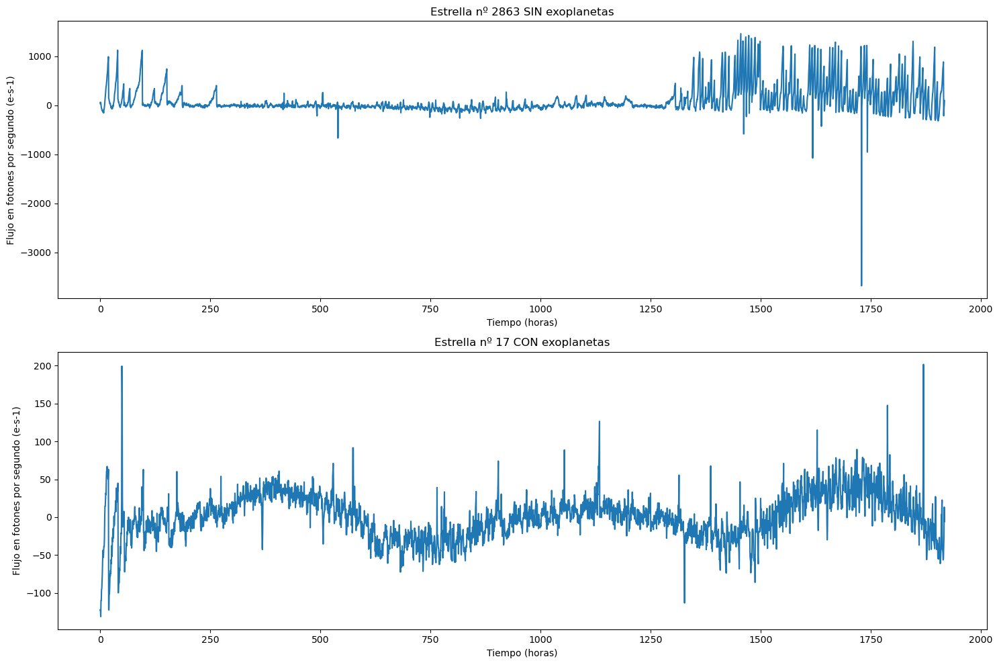

In [6]:
fig, ax = plt.subplots(2, 1, figsize=(15, 10))

# Se escoge una estrella aleatoria de cada clase
estrella1 = np.random.randint(0, len(train_df[train_df.LABEL == 0]))
estrella2 = np.random.randint(0, len(train_df[train_df.LABEL == 1]))

# Se extraen los datos de las distintas mediciones de luz, eliminando la columna "LABEL"
flujo1 = train_df[train_df.LABEL == 0].drop('LABEL', axis = 1).iloc[estrella1,:]
flujo2 = train_df[train_df.LABEL == 1].drop('LABEL', axis = 1).iloc[estrella2,:]

# Variable "tiempo" en horas
tiempo = np.arange(len(flujo1)) * (36/60)

# Graficar estrella sin exoplanetas
ax[0].set_title('Estrella nº {} SIN exoplanetas'.format(estrella1 + 1))
ax[0].plot(tiempo, flujo1)
ax[0].set_xlabel('Tiempo (horas)')
ax[0].set_ylabel('Flujo en fotones por segundo (e-s-1)')

# Graficar estrella sin exoplanetas
ax[1].set_title('Estrella nº {} CON exoplanetas'.format(estrella2 + 1))
ax[1].plot(tiempo, flujo2)
ax[1].set_xlabel('Tiempo (horas)')
ax[1].set_ylabel('Flujo en fotones por segundo (e-s-1)')

plt.tight_layout()

# Procesamiento de datos <a class="anchor" id="3"></a>
Como se puede observar, las gráficas de los flujos de luz de las estrellas se presentan de forma muy heterogénea en cuanto a forma y magnitud de los datos, por lo que es necesario adaptarlos a un estándar para que el entrenamiento del modelo no se vea influenciado por estas diferencias.

Se va a utilizar la estrella nº 10 CON exoplanetas a modo de ejemplo del tratamiento de datos y, posteriormente, se aplicará a todo el conjunto de datos.

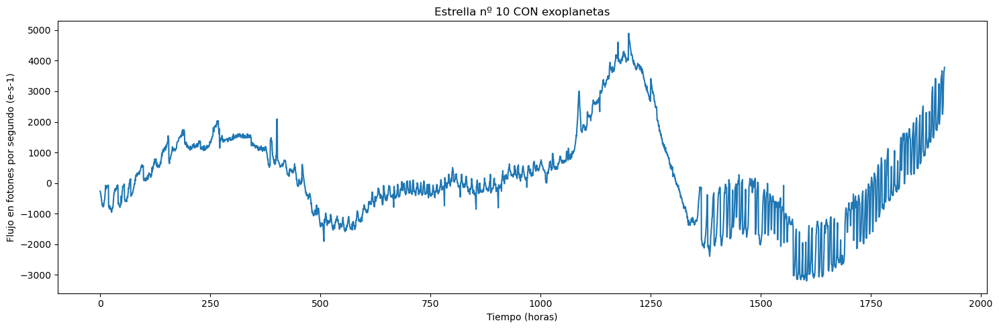

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))

i = 9 # Estrella de ejemplo para visualizar las transformaciones

# Se extraen los datos de las distintas mediciones de luz, eliminando la columna "LABEL"
flujo_bruto = train_df[train_df.LABEL == 1].drop('LABEL', axis = 1).iloc[i,:]
tiempo = np.arange(len(flujo1)) * (36/60) #Variable "tiempo" en horas

ax.set_title('Estrella nº {} CON exoplanetas'.format(i+1))
ax.plot(tiempo, flujo_bruto)
ax.set_xlabel('Tiempo (horas)')
ax.set_ylabel('Flujo en fotones por segundo (e-s-1)')

plt.tight_layout()

### 1. Abstracción de tendencia <a class="anchor" id="3.1"></a>
Se van a aplicar diferentes métodos para que los datos de cada estrella reflejen únicamente las variaciones de luz relativas con el objetivo de facilitar la identificación de patrones mediante las variaciones de flujo que sí son indicativas de la presencia de exoplanetas.

Esto es necesario ya que cada estrella tiene una intensidad diferente debido a la multitud de tamaños, formas de rotación, heterogeneidad de superficies, etc. que presentan. Es por esto que cada estrella tiene una forma diferente de brillar que puede variar de múltiples formas incluso en una misma estrella. El objetivo es eliminar estas variaciones para desvincular las variaciones de flujo provocadas por posibles exoplanetas de las variaciones derivadas de las fluctuaciones de la propia estrella.

Para ello, se aplicará un <b>desenfoque <i>gaussiano</i></b> que representará la tendencia general de la estrella y, posteriormente, se eliminará del flujo en bruto para obtener las variaciones relativas.

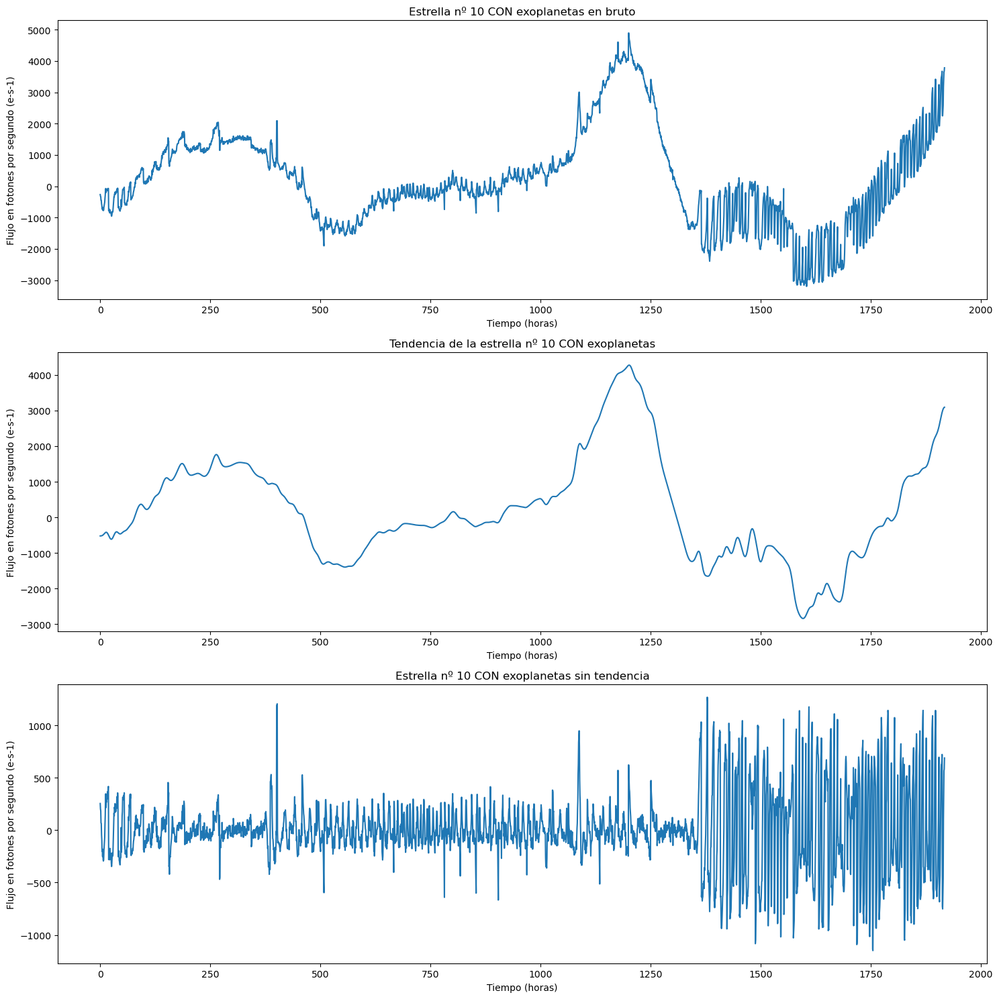

In [8]:
fig, ax = plt.subplots(3, 1, figsize=(15, 15))

# Se genera el flujo de desenfoque gaussiano
flujo_gaussiano = ndimage.gaussian_filter(np.array(flujo_bruto), sigma = 10)

# Se abstrae la tendencia
flujo_sin_tendencia = np.array(flujo_bruto) - flujo_gaussiano

# Flujo bruto
ax[0].set_title('Estrella nº {} CON exoplanetas en bruto'.format(i+1))
ax[0].plot(tiempo, flujo_bruto)
ax[0].set_xlabel('Tiempo (horas)')
ax[0].set_ylabel('Flujo en fotones por segundo (e-s-1)')

# Flujo de desenfoque
ax[1].set_title('Tendencia de la estrella nº {} CON exoplanetas'.format(i+1))
ax[1].plot(tiempo, flujo_gaussiano)
ax[1].set_xlabel('Tiempo (horas)')
ax[1].set_ylabel('Flujo en fotones por segundo (e-s-1)')

# Flujo sin tendencia
ax[2].set_title('Estrella nº {} CON exoplanetas sin tendencia'.format(i+1))
ax[2].plot(tiempo, flujo_sin_tendencia)
ax[2].set_xlabel('Tiempo (horas)')
ax[2].set_ylabel('Flujo en fotones por segundo (e-s-1)')

plt.tight_layout()

In [9]:
def abstraer_tendencia_gaussiana(bruto, sigma = 10):
    '''
    Dado un array, genera un flujo con desenfoque gaussiano (por defecto,
    desviavión estándar = 10) y lo abstrae del flujo original.
    '''
    # Generar flujo de desenfoque
    f1 = ndimage.gaussian_filter(bruto, sigma = sigma)
    
    # Abstraer el flujo de desenfoque del flujo en bruto para eliminar tendencia
    f2 = bruto - f1
    
    return f2

### 2. Datos atípicos superiores <a class="anchor" id="3.2"></a>
Los exoplanetas provocan una disminución de la luz percibida de la estrella al transitar delante de ella, por lo que todos los aumentos que superen cierto rango no aportan infromación relevante para su detección.

Para solucionarlo, se considerarán <i>outliers</i> superiores aquellos datos que superen <b>1.5</b> veces la media de los <b>100</b> valores más cercanos.

In [10]:
def eliminar_datos_atipicos_superiores(f, n = 100, sigma = 1.5):
    '''
    Detecta los outliers superiores si:
    
        outlier > threshold
        
    donde
    
        threshold = sigma * media
    
    donde
    
        media = mean(f[i-(n/2):i+(n/2)])
        
    donde i=cada uno de los valores de f; y los sustituye por el valor threshold.
    '''
    # Factorizar para que el valor mínimo sea 0
    factor = abs(min(f))
    f = f + factor
    
    # Thresholds invariantes ([de inicio a n] y [de n a final]) para calcularlos solo una vez
    threshold1 = sigma * np.mean(f[:n])
    threshold2 = sigma * np.mean(f[-n:])
    
    # Recorrer array para detectar e imputar outliers superiores
    for i in range(len(f)):
        if i <= n/2 and f[i] > threshold1:
            f[i] = threshold1
        elif i >= (len(f) - n) and f[i] > threshold2:
            f[i] = threshold2
        else: 
            threshold = sigma * np.mean(f[int(i-(n/2)):int(i+(n/2))])
            if f[i] > threshold:
                f[i] = threshold
    
    # Desfactorizar array para restablecer las magnitudes iniciales
    f = f - factor
    
    return f

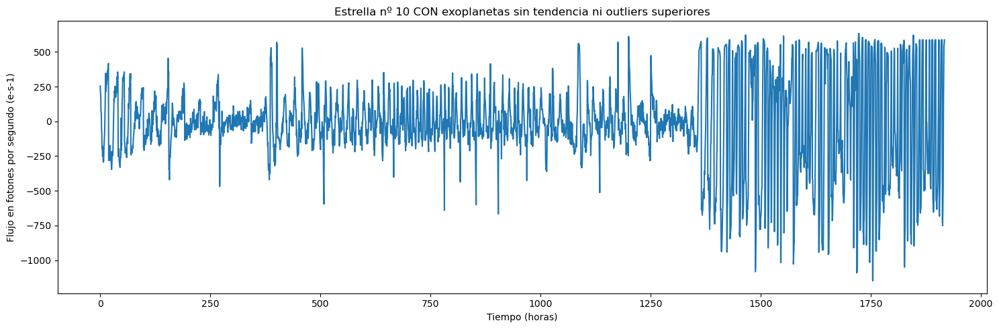

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))

# Se abstrae la tendencia
flujo_sin_outliers_superiores = eliminar_datos_atipicos_superiores(flujo_sin_tendencia)

# Flujo bruto
ax.set_title('Estrella nº {} CON exoplanetas sin tendencia ni outliers superiores'.format(i+1))
ax.plot(tiempo, flujo_sin_outliers_superiores)
ax.set_xlabel('Tiempo (horas)')
ax.set_ylabel('Flujo en fotones por segundo (e-s-1)')

plt.tight_layout()

### 3. Normalización <a class="anchor" id="3.3"></a>
Se normalizan los datos entre el rango <b>[0,1]</b>.

In [12]:
def normalizar(flujo):
    '''
    Normaliza los datos entre 0 y 1
    '''
    return (flujo - min(flujo)) / (max(flujo) - min(flujo))

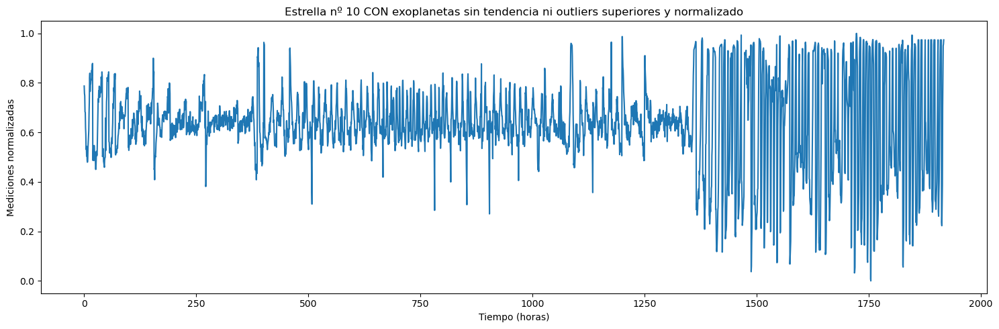

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))

flujo_limpio = normalizar(flujo_sin_outliers_superiores)

# Flujo bruto
ax.set_title('Estrella nº {} CON exoplanetas sin tendencia ni outliers superiores y normalizado'.format(i+1))
ax.plot(tiempo, flujo_limpio)
ax.set_xlabel('Tiempo (horas)')
ax.set_ylabel('Mediciones normalizadas')

plt.tight_layout()

### Aplicar a todos los datos de ambos datasets

In [14]:
def procesar(flujo):
    '''
    Realiza todo el procesamiento de datos: abstracción
    de tendencia, eliminación de outliers superiores
    y normalización
    '''
    f1 = abstraer_tendencia_gaussiana(flujo)
    f2 = eliminar_datos_atipicos_superiores(f1)
    fn = normalizar(f2)
    
    return fn

In [15]:
# Procesar dataset de entrenamiento
print('\033[1mProcesando dataset de entrenamiento\033[0m')
for i in range(len(train)):
    print('Línea {} de {}'.format(i+1, train_df.iloc[:,1:].shape[0]), end = '\r')
    train[i] = procesar(train[i])

# Replicar en el DataFrame
train_df.loc[:, train_df.columns != 'LABEL'] = train

# Procesar dataset de test
print('\n\n\033[1mProcesando dataset de test\033[0m')
for i in range(len(test)):
    print('Línea {} de {}'.format(i+1, test_df.iloc[:,1:].shape[0]), end = '\r')
    test[i] = procesar(test[i])

# Replicar en el DataFrame
test_df.loc[:, test_df.columns != 'LABEL'] = test

Procesando dataset de entrenamiento
Línea 5087 de 5087

Procesando dataset de test


# <i>Data Augmentation</i> <a class="anchor" id="4"></a>
Debido al fuerte desbalanceamiento de los datos de entrenamiento (<b><i>37</i></b> positivos vs <b><i>5'050</i></b> negativos), se van a aplicar varios métodos de aumento de datos para balancear el dataset.

### 1. Incremento y decremento en varias magnitudes <a class="anchor" id="4.1"></a>
Primero, se replicarán los registros positivos incrementando y decrementando sus valores en las siguientes <b>5</b> magnitudes: <b><i>0.01</i></b>, <b><i>0.02</i></b>, <b><i>0.03</i></b>, <b><i>0.04</i></b>, <b><i>0.05</i></b>.

Esto resultará en un total de <b><i>37</i></b> + <b><i>37</i></b> * <b><i>5</i></b> = <b><i>407</i></b> positivos.

In [16]:
train_augmented_1 = train
train_labels_augmented_1 = train_labels
train_positive = train[train_labels==1]

# Magnitudes en las que los datos positivos serán incrementados y decrementados
magnitudes = [0.01, 0.02, 0.03, 0.04, 0.05]

for i in magnitudes:
    
    # Calcular y agregar datos incrementados y decrementados
    train_augmented_1 = np.vstack((train_positive + i, train_augmented_1))
    train_augmented_1 = np.vstack((train_positive - i, train_augmented_1))
    
    # Agregar etiquetas positivas
    train_labels_augmented_1 = np.append([1 for i in range(train_positive.shape[0]*2)], train_labels_augmented_1)

print('Dimensión de los positivos del dataset de entrenamiento tras agregar datos incrementados y decrementados: \033[1m{}\033[0m'.format(train_augmented_1[train_labels_augmented_1==1].shape))

Dimensión de los positivos del dataset de entrenamiento tras agregar datos incrementados y decrementados: (407, 3197)


### 2. Ruido aleatorio <a class="anchor" id="4.2"></a>
El siguiento método consiste en aplicar, a cada uno de los registros resultantes del paso anterior, 6 instancias de ruido <i>gaussiano</i> aleatorio. Tras esto, el número de positivos en el dataset se incrementará hasta <b><i>407</i></b> + <b><i>407</i></b> * <b><i>6</i></b> = <b><i>2'849</i></b>

In [17]:
train_augmented_2 = train_augmented_1
train_labels_augmented_2 = train_labels_augmented_1
train_positive_augmented_2 = train_augmented_2[train_labels_augmented_2==1]

# Magnitud del ruido aleatorio a generar
ruido = [0.00015, 0.0003, 0.00045, 0.0006, 0.00075, 0.0009]

for i in ruido:
    
    # Generar y agregar ruido
    train_augmented_2 = np.vstack((train_positive_augmented_2 + np.random.normal(0, i, train_positive_augmented_2.shape), train_augmented_2))
    
    # Agregar etiquetas positivas
    train_labels_augmented_2 = np.append([1 for i in range(len(train_positive_augmented_2))], train_labels_augmented_2)
    
print('Dimensión del dataset de entrenamiento tras agregar ruido: \033[1m{}\033[0m'.format(train_augmented_2[train_labels_augmented_2==1].shape))

Dimensión del dataset de entrenamiento tras agregar ruido: (2849, 3197)


## Aplanamiento superior <a class="anchor" id="4.3"></a>

El aumento de datos ha provocado que los nuevos registros añadidos no estén entre el rango de valores normalizados <b>[0,1]</b>. Esto se debe a que, al añadir los incrementos, decrementos y ruido, se haya superado dicho rango tanto superior como inferiormente.

In [18]:
print('Rango de valores de los datos sin aumentar: [\033[1m{}\033[0m, \033[1m{}\033[0m]'.format(np.min(train), np.max(train)))
print('Rango de valores de los datos aumentados: [\033[1m\x1B[3m{}\x1B[0m\033[0m, \033[1m\x1B[3m{}\x1B[0m\033[0m]'.format(round(np.min(train_augmented_2),2), round(np.max(train_augmented_2),2)))

Rango de valores de los datos sin aumentar: [0.0, 1.0]
Rango de valores de los datos aumentados: [-0.05, 1.05]


Para solucionarlo, se van a imputar los valores que lo sobrepasen por encima pero no por debajo, ya que estos últimos podrían tratarse de curvas de luz que quedarían distorsionas. Por lo tanto, para que todos lo valores queden dentro del rango, se van a desplazar los registros necesarios para que sus valores mínimos no lo sobrepasen por debajo y, posteriormente, se realizará el aplanamiento superior.

In [19]:
train_augmented = train_augmented_2
train_augmented_labels = train_labels_augmented_2

# Incrementar registros que sobrepasen el rango inferior
for i in range(len(train_augmented)):
    if min(train_augmented[i]) < np.min(train):
        train_augmented[i] = train_augmented[i] + abs(min(train_augmented[i]))
        
# Imputar valores por encima del rango con el valor máximo del rango
train_augmented[train_augmented_2 > np.max(train)] = np.max(train)

print('Rango de valores de los datos aumentados tras aplanarlos: [\033[1m{}\033[0m, \033[1m{}\033[0m]'.format(np.min(train_augmented), np.max(train_augmented)))

Rango de valores de los datos aumentados tras aplanarlos: [0.0, 1.0]


# Clasificación <a class="anchor" id="5"></a>

## Estrategia A - Distribuciones <a class="anchor" id="5.1"></a>
Cada línea del conjunto de datos es un vector cuyos valores representan el valor de la luminosidad de una estrella en un momento del tiempo. Esta estrategia consiste en generar un nuevo dataset en el que cada línea represente varias medidas estadísticas de la distribución de las mediciones de luz de las estrellas (es decir, cada fila es una distribución de los datos de las mediciones de luz de cada estrella, y cada columna es una de sus medidas: <b>media</b>,  <b>varianza</b>, <b>desviación estandar</b> y <b>quintiles</b>).

### Generación del nuevo dataset <a class="anchor" id="5.1.1"></a>
Calculamos las medidas a ser utilizadas y las cargamos en un nuevo dataset.

In [20]:
def estrategiaA_datos(dataset):
    '''
    Dado un dataset, devuelve las siguientes medidas
    estadísticas de cada línea como un nuevo dataset:
    Media
    Varianza
    Desviación estándar
    Quintil 0 (mínimo)
    Quintil 1-9
    Quintil 10 (máximo)
    '''
    # Calcular medidas estadísticas
    media = np.mean(dataset, axis=1)
    varianza = np.var(dataset, axis=1)
    desviacion_estandar = np.std(dataset, axis=1)
    q0 = np.quantile(dataset, 0, axis=1)
    q1 = np.quantile(dataset, 0.1, axis=1)
    q2 = np.quantile(dataset, 0.2, axis=1)
    q3 = np.quantile(dataset, 0.3, axis=1)
    q4 = np.quantile(dataset, 0.4, axis=1)
    q5 = np.quantile(dataset, 0.5, axis=1)
    q6 = np.quantile(dataset, 0.6, axis=1)
    q7 = np.quantile(dataset, 0.7, axis=1)
    q8 = np.quantile(dataset, 0.8, axis=1)
    q9 = np.quantile(dataset, 0.9, axis=1)
    q10 = np.quantile(dataset, 1, axis=1)
    
    new = []
    for i in range(len(dataset)):
        new.append([media[i],
                    varianza[i],
                    desviacion_estandar[i],
                    q0[i],
                    q1[i],
                    q2[i],
                    q3[i],
                    q4[i],
                    q5[i],
                    q6[i],
                    q7[i],
                    q8[i],
                    q9[i],
                    q10[i]])
    
    # Devolver como array
    return np.array(new)

a_train = estrategiaA_datos(train_augmented)
a_test = estrategiaA_datos(test)

# Construir dataframe de entrenamiento
a_train_df = pd.DataFrame(a_train, columns = ['Media', 'Varianza', 'Desviacion estandar', 'q0', 'q1', 'q2', 'q3', 'q4', 'q5', 'q6', 'q7', 'q8', 'q9', 'q10'])
a_train_df.insert(loc=0, column='LABEL', value=train_augmented_labels)

# Construir dataframe de test
a_test_df = pd.DataFrame(a_test, columns = ['Media', 'Varianza', 'Desviacion estandar', 'q0', 'q1', 'q2', 'q3', 'q4', 'q5', 'q6', 'q7', 'q8', 'q9', 'q10'])
a_test_df.insert(loc=0, column='LABEL', value=test_labels)

print('Dimensiones de los nuevos datos de entrenamiento: \033[1m{}\033[0m'.format(a_train.shape))
print('Dimensiones de los nuevos datos de test: \033[1m{}\033[0m'.format(a_test.shape))

Dimensiones de los nuevos datos de entrenamiento: (7899, 14)
Dimensiones de los nuevos datos de test: (570, 14)


In [21]:
# Medidas de la distribución de la primera estrella
a_train_df[0:1]

,LABEL,Media,Varianza,Desviacion estandar,q0,q1,q2,q3,q4,q5,q6,q7,q8,q9,q10
0,1,0.727156,0.005154,0.071791,0.0,0.639134,0.67629,0.698292,0.714249,0.725963,0.740721,0.757764,0.78047,0.812636,0.999329


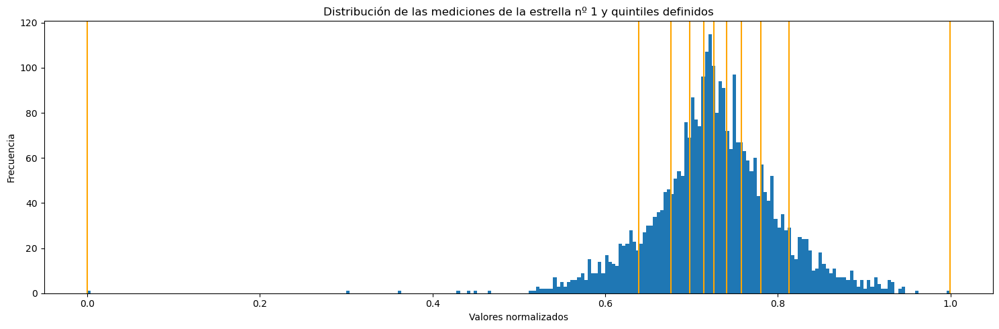

In [22]:
# Distribución de las mediciones de la primera estrella
fig, ax = plt.subplots(1, 1, figsize=(15, 5))

# Graficar distribución y quintiles
ax.set_title('Distribución de las mediciones de la estrella nº {} y quintiles definidos'.format(1))
ax.hist(train_augmented[0], bins=250)
for i in range(3, 14):
    ax.axvline(x=a_train[0][i], c='orange')
ax.set_ylabel('Frecuencia')
ax.set_xlabel('Valores normalizados')

plt.tight_layout()

### Modelos <a class="anchor" id="5.1.2"></a>

#### Definición
Se construirán y probarán 3 modelos diferentes con las siguientes estructuras:
<ul><b>Modelo con 5 capas ocultas</b>
    <li>Capa de entrada de <b><i>14</i></b> neuronas.</li>
    <li>Capa densa de <b><i>128</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>64</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>32</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>10</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>8</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa de salida de <b><i>1</i></b> neurona y activación <i>sigmoid</i>.</li>
</ul>
<ul><b>Modelo con 4 capas ocultas</b>
    <li>Capa de entrada de <b><i>14</i></b> neuronas.</li>
    <li>Capa densa de <b><i>64</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>32</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>10</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>8</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa de salida de <b><i>1</i></b> neurona y activación <i>sigmoid</i>.</li>
</ul>
<ul><b>Modelo con 3 capas ocultas</b>
    <li>Capa de entrada de <b><i>14</i></b> neuronas.</li>
    <li>Capa densa de <b><i>32</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>10</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>8</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa de salida de <b><i>1</i></b> neurona y activación <i>sigmoid</i>.</li>
</ul>
En todos ellos se usará como función de pérdida <b><i>binary crossentropy</i></b> y se monitorizarán las métricas <b><i>accuracy</i></b> y <b><i>F1 Score</i></b>.

In [23]:
def get_model_A(a_train, n):
    v = {5,4,3}
    if n not in v:
        raise ValueError('El número de capas debe estar entre los siguientes: %r.' %v)
    if n==5:
        a = Sequential(name='Estrategia_A_5_capas')
        a.add(Dense(128, input_dim=a_train.shape[1], activation='relu', name='h1'))
    elif n==4:
        a = Sequential(name='Estrategia_A_4_capas')
        a.add(Dense(64, input_dim=a_train.shape[1], activation='relu', name='h1'))
    elif n==3:
        a = Sequential(name='Estrategia_A_3_capas')
        a.add(Dense(32, input_dim=a_train.shape[1], activation='relu', name='h1'))
    
    a.add(Dense(10, activation='relu', name='h4'))
    a.add(Dense(8, activation='relu', name='h5'))
    
    a.add(Dense(1, activation='sigmoid', name='output'))
    
    return a

#### Entrenamiento
Con cada modelo se testearán diferentes hiperparámetros durante el entrenamiento:
<ul>
    <li><i>Learning rate</i>: <b><i>0.01</i></b>, <b><i>0.001</i></b> y <b><i>0.0001</i></b></li>
    <li>Máx. <i>epochs</i>: <b><i>1500</i></b>. Debido a los callbacks definidos más adelante, no es necesario variar el número de <i>epochs</i>.</li>
    <li><i>Batch size</i>: <b><i>128</i></b> y <b><i>256</i></b></li>
</ul>
Todos los entrenamientos se realizarán con los siguientes <i>callbacks</i>:
<ul>
    <li><i>EarlyStopping</i>: Detendrá el entrenamiento cuando el <i>accuracy</i> con los datos de entrenamiento no mejore durante 200 <i>epochs</i> consecutivos</li>
    <li><i>ModelCheckpoint</i>: Guradará los pesos calculados en la iteración que resulte en un mayor <i>F1 Score</i> con lo datos de validación.</li>
</ul>

In [24]:
# Definir métrica f1 para monitorizar durante el entrenamiento
def f1(y_true, y_pred):
    '''
    Calcula el f1 score a partir de tensores.
    https://stackoverflow.com/a/45305384/5210098
    '''
    def recall(y_true, y_pred):
        '''
        Calcula el recall a partir de tensores.
        '''
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall
    
    def precision(y_true, y_pred):
        '''
        Calcula la precision a partir de tensores.
        '''
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision
    
    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [25]:
def entrenamiento_estrategia_a(train, test, capas, learning_rate, epochs, batch_size, folder):
    '''
    Realiza el entrenamiento del modelo facilitado junto al learning rate,
    número máximo de epochs y tamaño del batch
    '''
    #Construir modelo
    a = get_model_A(a_train=train, n=capas)
    
    # Compilar modelo
    a.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=learning_rate), metrics=['accuracy', f1])
    
    # Crear path para salvar los pesos del modelo
    path = (folder + '/' + a.name + '_' + str(learning_rate) + 'LR_' + str(epochs) + 'Epochs_' + str(batch_size) + 'Batch.h5')
    
    # Definir callbacks para que el modelo deje de entrenar cuando el accuracy de validación
    # deje de crecer y guarde el modelo con mejor f1 score
    callbacks = [EarlyStopping(monitor = 'accuracy',
                               mode = 'max',
                               patience = 200
                              ),
                 ModelCheckpoint(filepath = path,
                                 monitor = 'val_f1',
                                 mode = 'max',
                                 save_best_only = True,
                                 save_weights_only = True,
                                )
                ]
    
    # Entrenar
    afit = a.fit(train, train_augmented_labels,
                 epochs = epochs,
                 validation_data = (test, test_labels),
                 batch_size = batch_size,
                 callbacks = callbacks,
                 verbose = 0)
    
    return a, afit, path

In [26]:
# Definir parámetros
a_capas = [5, 4, 3]
lr = [0.01, 0.001, 0.0001]
epochs = 1500
batch = [128, 256]
a_trained_models = []
a_fit_models = []
a_paths = []

# Entrenar todos los modelos y combinaciones de hiperparámetros
for a in a_capas:
    for l in lr:
        for b in batch:
            print('Entrenando modelo de \033[1m{}\033[0m capas con learning rate \033[1m{}\033[0m y batch size \033[1m{}\033[0m'.format(a, l, b))
            a_t_m, a_f_m, a_p = entrenamiento_estrategia_a(train=a_train, test=a_test, capas=a, learning_rate=l, epochs=epochs, batch_size=b, folder='Weights A')
            a_trained_models.append(a_t_m)
            a_fit_models.append(a_f_m)
            a_paths.append(a_p)

Entrenando modelo de 5 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.01 y batch size 256
Entrenando modelo de 5 capas con learning rate 0.001 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.001 y batch size 256
Entrenando modelo de 5 capas con learning rate 0.0001 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.0001 y batch size 256
Entrenando modelo de 4 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 4 capas con learning rate 0.01 y batch size 256
Entrenando modelo de 4 capas con learning rate 0.001 y batch size 128
Entrenando modelo de 4 capas con learning rate 0.001 y batch size 256
Entrenando modelo de 4 capas con learning rate 0.0001 y batch size 128
Entrenando modelo de 4 capas con learning rate 0.0001 y batch size 256
Entrenando modelo de 3 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 3 capas con learning rate 0.01 y batch size 256
Entrenando modelo de 3

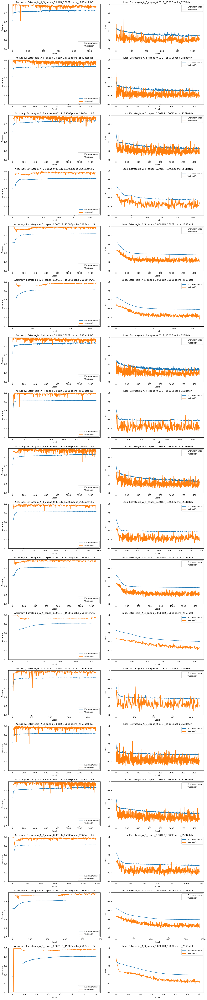

In [27]:
# Plots
fig, ax = plt.subplots(len(a_fit_models), 2, figsize=(15,len(a_fit_models)*4))

for i, afit in enumerate(a_fit_models):
    ax[i,0].set_title('Accuracy: ' + a_paths[i][10:])
    ax[i,0].plot(afit.history['accuracy'])
    ax[i,0].plot(afit.history['val_accuracy'])
    ax[i,0].set_ylabel('Accuracy')
    ax[i,0].set_xlabel('Epoch')
    ax[i,0].set_ylim(0,1)
    ax[i,0].legend(['Entrenamiento', 'Validación'], loc='lower right')
    
    ax[i,1].set_title('Loss: ' + a_paths[i][10:-3])
    ax[i,1].plot(afit.history['loss'])
    ax[i,1].plot(afit.history['val_loss'])
    ax[i,1].set_ylabel('Loss')
    ax[i,1].set_xlabel('Epoch')
    ax[i,1].set_ylim(0,1)
    ax[i,1].legend(['Entrenamiento', 'Validación'], loc='upper right')

plt.tight_layout()

### Resultados <a class="anchor" id="5.1.3"></a>
A continuación se muestras las matrices de confusión de las predicciones de los modelos entrenados con cada combinación de hiperparámetros.

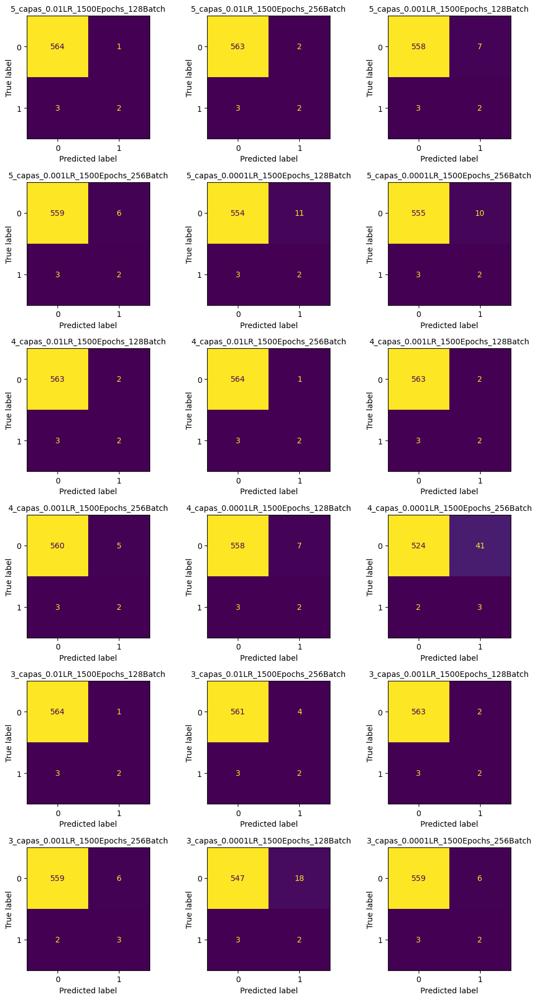

In [28]:
# Confusion matrix
fig, ax = plt.subplots(int(len(a_trained_models)/3), 3, figsize=(10,len(a_trained_models)))
ax=ax.flatten()
a_f1 = []

for i, a in enumerate(a_trained_models):
    a.load_weights(a_paths[i])
    a_test_predicted = np.round(a.predict(a_test, verbose=0),0)
    a_f1.append(f1_score(test_labels,a_test_predicted))
    cm = confusion_matrix(test_labels, a_test_predicted)
    
    ax[i].set_title(a_paths[i][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax[i], colorbar=False)
    
plt.tight_layout()

In [29]:
for i, a in enumerate(a_trained_models):
    a.load_weights(a_paths[i])
    a_test_predicted = np.round(a.predict(a_test, verbose=0),0)
    print('\033[1m{}\033[0m'.format(a_paths[i][23:-3]), end='\t')
    print("Accuracy:\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,a_test_predicted)*100), end='\t')
    print("Precision:\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,a_test_predicted)*100), end='\t  ')
    print("Recall:\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,a_test_predicted)*100), end='\t')
    print("F1 Score:\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,a_test_predicted)*100), end = '')

5_capas_0.01LR_1500Epochs_128Batch	Accuracy:99.3%	Precision:66.7%	  Recall:40.0%	F1 Score:50.0%
5_capas_0.01LR_1500Epochs_256Batch	Accuracy:99.1%	Precision:50.0%	  Recall:40.0%	F1 Score:44.4%
5_capas_0.001LR_1500Epochs_128Batch	Accuracy:98.2%	Precision:22.2%	  Recall:40.0%	F1 Score:28.6%
5_capas_0.001LR_1500Epochs_256Batch	Accuracy:98.4%	Precision:25.0%	  Recall:40.0%	F1 Score:30.8%
5_capas_0.0001LR_1500Epochs_128Batch	Accuracy:97.5%	Precision:15.4%	  Recall:40.0%	F1 Score:22.2%
5_capas_0.0001LR_1500Epochs_256Batch	Accuracy:97.7%	Precision:16.7%	  Recall:40.0%	F1 Score:23.5%
4_capas_0.01LR_1500Epochs_128Batch	Accuracy:99.1%	Precision:50.0%	  Recall:40.0%	F1 Score:44.4%
4_capas_0.01LR_1500Epochs_256Batch	Accuracy:99.3%	Precision:66.7%	  Recall:40.0%	F1 Score:50.0%
4_capas_0.001LR_1500Epochs_128Batch	Accuracy:99.1%	Precision:50.0%	  Recall:40.0%	F1 Score:44.4%
4_capas_0.001LR_1500Epochs_256Batch	Accuracy:98.6%	Precision:28.6%	  Recall:40.0%	F1 Score:33.3%
4_capas_0.0001LR_1500Epochs_128B

#### Mejor modelo
Se utilizará el <i>F1 Score</i> como criterio para discernir cuál es el mejor de los modelos anteriores. Esto se debe a que esta métrica es la que mejor refleja el rendimiento de los modelos a la hora de clasificar los positivos.

In [30]:
a_best_id = np.argwhere(a_f1 == max(a_f1))
a_best = []
a_best_path = []

if len(a_best_id) > 1:
    print('Los mejores modelos con el mismo F1 Score son:')
else:
    print('El mejor modelo es:')

for i in a_best_id:
    a_best.append(a_trained_models[i[0]])
    a_best_path.append(a_paths[i[0]])
    print('\033[1m{}\033[0m'.format(a_best_path[-1][23:-3]))

Los mejores modelos con el mismo F1 Score son:
5_capas_0.01LR_1500Epochs_128Batch
4_capas_0.01LR_1500Epochs_256Batch
3_capas_0.01LR_1500Epochs_128Batch


In [31]:
for i, a in enumerate(a_best):
    a_test_predicted = np.round(a.predict(a_test, verbose=0),0)
    
    print("MODELO: \033[1m{}\033[0m".format(a_best_path[i][23:-3]))
    print("Accuracy:\t\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,a_test_predicted)*100))
    print("Precision:\t\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,a_test_predicted)*100))
    print("Recall:\t\t\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,a_test_predicted)*100))
    print("F1 Score:\t\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,a_test_predicted)*100))
    print(classification_report(test_labels, a_test_predicted), end='\n\n\n')

MODELO: 5_capas_0.01LR_1500Epochs_128Batch
Accuracy:	99.3%
Precision:	66.7%
Recall:		40.0%
F1 Score:	50.0%

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       565
           1       0.67      0.40      0.50         5

    accuracy                           0.99       570
   macro avg       0.83      0.70      0.75       570
weighted avg       0.99      0.99      0.99       570



MODELO: 4_capas_0.01LR_1500Epochs_256Batch
Accuracy:	99.3%
Precision:	66.7%
Recall:		40.0%
F1 Score:	50.0%

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       565
           1       0.67      0.40      0.50         5

    accuracy                           0.99       570
   macro avg       0.83      0.70      0.75       570
weighted avg       0.99      0.99      0.99       570



MODELO: 3_capas_0.01LR_1500Epochs_128Batch
Accuracy:	99.3%
Precision:	66.7%
Recall:		40.0%
F1 Score:	50.0%

              prec

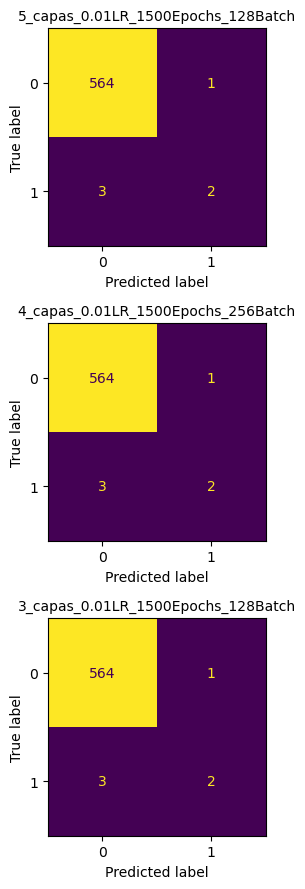

In [32]:
# Confusion matrix
if len(a_best) > 1:
    fig, ax = plt.subplots(int(len(a_best)), 1, figsize=(10,len(a_trained_models)/2))
    ax=ax.flatten()
    
    for i, a in enumerate(a_best):
        a_test_predicted = np.round(a.predict(a_test, verbose=0),0)
        cm = confusion_matrix(test_labels, a_test_predicted)
        
        ax[i].set_title(a_best_path[i][23:-3], fontsize=10)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp = disp.plot(ax=ax[i], colorbar=False)

else:
    fig, ax = plt.subplots(1, 1, figsize=(10,5))
    
    a_test_predicted = np.round(a_best[0].predict(a_test, verbose=0),0)
    cm = confusion_matrix(test_labels, a_test_predicted)
    
    ax.set_title(a_best_path[0][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax, colorbar=False)

plt.tight_layout()

## Estrategia B - Selección de dimensionalidad <a class="anchor" id="5.2"></a>
Esta estrategia consiste en establecer un mecanismo para detectar posibles tránsitos en los datos y generar un nuevo vector únicamente con las dimensiones seleccionadas y otro vector con sus posiciones.

### Extracción de posibles tránsitos <a class="anchor" id="5.2.1"></a>

In [33]:
def estrategiaB_datos(f, n = 32, sigma = .82, w = 8):
    '''
    Detecta los posibles tránsitos si:
    
        medición < threshold
        
    donde
    
        threshold = sigma * media
    
    donde
    
        media = mean(f[i-(n/2):i+(n/2)])
        
    donde i=cada uno de los valores de f; y se almacena su posición junto con las w posiciones más cercanas.
    Se devuelve el vector de posiciones, el de las mediciones de las mismas y el número de tránsitos detectados.
    '''
    # Vector posición
    position = []
    
    # Vector de posiciones únicas (sin w posiciones más cercanas)
    position_unique = []
    
    # Thresholds invariantes ([de inicio a n] y [de n a final]) para calcularlos solo una vez
    threshold1 = sigma * np.mean(f[:n])
    threshold2 = sigma * np.mean(f[-n:])
    
    # Recorrer array para detectar posibles tránsitos
    for i in range(len(f)):
        
        if i <= n/2 and f[i] < threshold1:
            
            # Almacenar w posiciones más cercanas en el vector posiciones
            if i < w/2:
                transit = np.arange(0, w)
                position.append(transit)
            else:
                transit = np.arange(int(i-(w/2)), int(i+(w/2))+1)
                position.append(transit)
            
            # Almacenar únicamente la posición de la medición menor dentro del tránsito
            position_unique.append(int(i-w/2)+np.argmin(f[transit]))
                
        elif i >= (len(f) - n) and f[i] < threshold2:
                        
            # Almacenar w posiciones más cercanas en el vector posiciones
            if i >= len(f) - w/2:
                transit = np.arange(len(f)-w-1, len(f))
                position.append(transit)
            else:
                transit = np.arange(int(i-(w/2)), int(i+(w/2))+1)
                position.append(transit)
            
            # Almacenar únicamente la posición de la medición menor dentro del tránsito
            position_unique.append(int(i-w/2)+np.argmin(f[transit]))
                
        elif i > n/2 and i < (len(f) - n) and f[i] < sigma * np.mean(f[int(i-(n/2)):int(i+(n/2))]):
            
            # Almacenar w posiciones más cercanas en el vector posiciones
            transit = np.arange(int(i-(w/2)), int(i+(w/2))+1)
            position.append(transit)
            
            # Almacenar únicamente la posición de la medición menor dentro del tránsito
            position_unique.append(int(i-w/2)+np.argmin(f[transit]))
    
    # Eliminar superposiciones del vector posiciones
    position = np.unique(np.concatenate(position))
    position_unique = np.unique(position_unique)
    
    return np.array(f[position]), np.array(position), np.array(position_unique)

#### Ejemplo gráfico

Número de posibles tránsitos detectados: 65


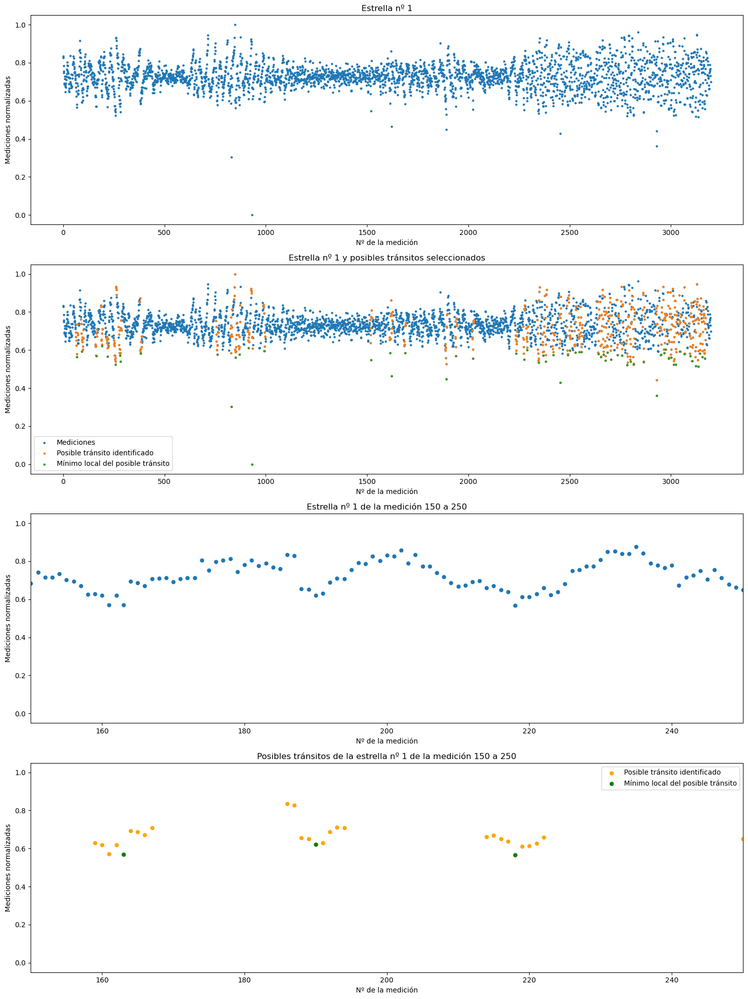

In [34]:
# Seleccionar estrella de ejemplo
estrella = 0

# Obtener vectores de mediciones y posiciones
t, p, u = estrategiaB_datos(train_augmented[estrella])

# Graficar
fig, ax = plt.subplots(4, 1, figsize=(15, 20))
xlim = (150,250)
s1 = 5
s2 = 25

# Estrella de ejemplo completa
ax[0].set_title('Estrella nº {}'.format(estrella+1))
ax[0].scatter(range(len(train_augmented[estrella])), train_augmented[estrella], s=s1)
ax[0].set_xlabel('Nº de la medición')
ax[0].set_ylabel('Mediciones normalizadas')

# Estrella de ejemplo completa junto a las dimensiones seleccionadas
ax[1].set_title('Estrella nº {} y posibles tránsitos seleccionados'.format(estrella+1))
ax[1].scatter(range(len(train_augmented[0])), train_augmented[estrella], s=s1)
ax[1].scatter(p, t, s=s1)
ax[1].scatter(u, train_augmented[estrella][u], s=s1)
ax[1].set_xlabel('Nº de la medición')
ax[1].set_ylabel('Mediciones normalizadas')
ax[1].legend(['Mediciones', 'Posible tránsito identificado', 'Mínimo local del posible tránsito'])

# Zoom en estrella de ejemplo completa
ax[2].set_title('Estrella nº {} de la medición {} a {}'.format(estrella+1, xlim[0], xlim[1]))
ax[2].scatter(range(len(train_augmented[0])), train_augmented[estrella], s=s2)
ax[2].set_xlabel('Nº de la medición')
ax[2].set_ylabel('Mediciones normalizadas')
ax[2].set_xlim(xlim)

# Zoom en las dimensiones seleccionadas de la estrella de ejemplo
ax[3].set_title('Posibles tránsitos de la estrella nº {} de la medición {} a {}'.format(estrella+1, xlim[0], xlim[1]))
ax[3].scatter(p, t, s=s2, c='orange')
ax[3].scatter(u, train_augmented[estrella][u], s=s2, c='green')
ax[3].set_xlabel('Nº de la medición')
ax[3].set_ylabel('Mediciones normalizadas')
ax[3].set_xlim(xlim)
ax[3].legend(['Posible tránsito identificado', 'Mínimo local del posible tránsito'])

plt.tight_layout()
print('Número de posibles tránsitos detectados: \033[1m{}\033[0m'.format(len(u)))

#### Aplicar a todo el dataset

In [35]:
# Dataset de entrenamiento
b_train = []
b_train_positions = []
b_train_unique = []

print('\033[1mDATASET DE ENTRENAMIENTO\033[0m')
for c, i in enumerate(train_augmented):
    print('Fila {} de {}'.format(c+1, len(train_augmented)), end='\r')
    b_t, b_t_p, b_t_u = estrategiaB_datos(i)
    b_train.append(b_t)
    b_train_positions.append(b_t_p)
    b_train_unique.append(b_t_u)

# Dataset de test
b_test = []
b_test_positions = []
b_test_unique = []

print('\n\n\033[1mDATASET DE TEST\033[0m')
for c, i in enumerate(test):
    print('Fila {} de {}'.format(c+1, len(test)), end='\r')
    b_t, b_t_p, b_t_u = estrategiaB_datos(i)
    b_test.append(b_t)
    b_test_positions.append(b_t_p)
    b_test_unique.append(b_t_u)

DATASET DE ENTRENAMIENTO
Fila 7899 de 7899

DATASET DE TEST


### Distribución de las mediciones y frecuencia de aparición de los posibles tránsitos <a class="anchor" id="5.2.2"></a>
A partir del datset anterior, se generará un nuevo conjunto de datos cuyas dimensiones condensen los resultados obtenidos acerca de los posibles tránsitos y sus posiciones (para no perder la información de la frecuencia) de forma parecida a la Estrategia A. Posteriormente, se construirá y entrenará un modelo de clasificación.

In [36]:
def estrategiaB_distribuciones(transits, positions_unique):
    '''
    Calcula la frecuencia de aparición de posibles tránsitos y genera un dataset con las medidas de las
    distribuciones de la frecuencia y las mediciones de los mismos.
    '''
    n = len(positions_unique)
    
    # Obtener frecuencia de aparación de tránsitos
    frec = []
    for i in range(n):
        if i == 0:
            frec.append(positions_unique[i])
        else:
            frec.append(positions_unique[i] - positions_unique[i-1])
    
    # Medidas de la distribución de la frecuencia de aparición de posibles tránsitos
    frec_media = np.mean(frec)
    frec_varianza = np.var(frec)
    frec_desviacion_estandar = np.std(frec)
    frec_mediana = np.median(frec)
    frec_q0 = np.quantile(frec, 0)
    frec_q1 = np.quantile(frec, 0.2)
    frec_q2 = np.quantile(frec, 0.4)
    frec_q3 = np.quantile(frec, 0.6)
    frec_q4 = np.quantile(frec, 0.8)
    frec_q5 = np.quantile(frec, 1)
    
    # Medidas de la distribución de las mediciones de los posibles tránsitos
    media = np.mean(transits)
    varianza = np.var(transits)
    desviacion_estandar = np.std(transits)
    mediana = np.median(transits)
    q0 = np.quantile(transits, 0)
    q1 = np.quantile(transits, 0.2)
    q2 = np.quantile(transits, 0.4)
    q3 = np.quantile(transits, 0.6)
    q4 = np.quantile(transits, 0.8)
    q5 = np.quantile(transits, 1)
    
    new = [n, frec_media, frec_varianza, frec_desviacion_estandar, frec_mediana,
           frec_q0, frec_q1, frec_q2, frec_q3, frec_q4, frec_q5,
           media, varianza, desviacion_estandar, mediana,
           q0, q1, q2, q3, q4, q5]
    
    return np.array(new), frec

#### Nuevo dataset

In [37]:
# Entrenamiento
b1_train = []
b1_train_frec = []
print('\033[1mDATOS DE ENTRENAMIENTO\033[0m')
for i in range(len(b_train)):
    print('Fila {} de {}'.format(i+1, len(b_train)), end='\r')
    b1_t, b1_f = estrategiaB_distribuciones(b_train[i], b_train_unique[i])
    b1_train.append(b1_t)
    b1_train_frec.append(b1_f)

b1_train = np.array(b1_train)
b1_train_frec = np.array(b1_train_frec)
print('Dimensiones del dataset de entrenamiento: \033[1m{}\033[0m'.format(b1_train.shape))

# Test
b1_test = []
b1_test_frec = []
print('\n\n\033[1mDATOS DE TEST\033[0m')
for i in range(len(b_test)):
    print('Fila {} de {}'.format(i+1, len(b_test)), end='\r')
    b1_t, b1_f = estrategiaB_distribuciones(b_test[i], b_test_unique[i])
    b1_test.append(b1_t)
    b1_test_frec.append(b1_f)

b1_test = np.array(b1_test)
b1_test_frec = np.array(b1_test_frec)
print('Dimensiones del dataset de test: \033[1m{}\033[0m'.format(b1_test.shape))

# Construir dataframe de entrenamiento
b1_train_df = pd.DataFrame(b1_train, columns = ['Transitos', 'Frec.: media', 'Frec.: varianza', 'Frec.: desviacion estandar',
                                                'Frec.: mediana', 'Frec.: q0', 'Frec.: q1', 'Frec.: q2', 'Frec.: q3', 'Frec.: q4',
                                                'Frec.: q5', 'Media', 'Varianza', 'Desviacion estandar', 'Mediana',
                                                'q0', 'q1', 'q2', 'q3', 'q4', 'q5',])
b1_train_df.insert(loc=0, column='LABEL', value=train_augmented_labels)

# Construir dataframe de test
b1_test_df = pd.DataFrame(b1_test, columns = ['Transitos', 'Frec.: media', 'Frec.: varianza', 'Frec.: desviacion estandar',
                                                'Frec.: mediana', 'Frec.: q0', 'Frec.: q1', 'Frec.: q2', 'Frec.: q3', 'Frec.: q4',
                                                'Frec.: q5', 'Media', 'Varianza', 'Desviacion estandar', 'Mediana',
                                                'q0', 'q1', 'q2', 'q3', 'q4', 'q5',])
b1_test_df.insert(loc=0, column='LABEL', value=test_labels)

DATOS DE ENTRENAMIENTO
Dimensiones del dataset de entrenamiento: (7899, 21)


DATOS DE TEST
Dimensiones del dataset de test: (570, 21)


In [38]:
# Medidas de la distribución de la primera estrella
pd.options.display.max_columns = None
b1_train_df[0:1]

,LABEL,Transitos,Frec.: media,Frec.: varianza,Frec.: desviacion estandar,Frec.: mediana,Frec.: q0,Frec.: q1,Frec.: q2,Frec.: q3,Frec.: q4,Frec.: q5,Media,Varianza,Desviacion estandar,Mediana,q0,q1,q2,q3,q4,q5
0,1,65.0,48.723077,6817.831006,82.570158,22.0,3.0,12.0,17.6,27.4,61.8,527.0,0.69539,0.011816,0.108701,0.6851,0.0,0.59961,0.659095,0.719194,0.789377,0.999329


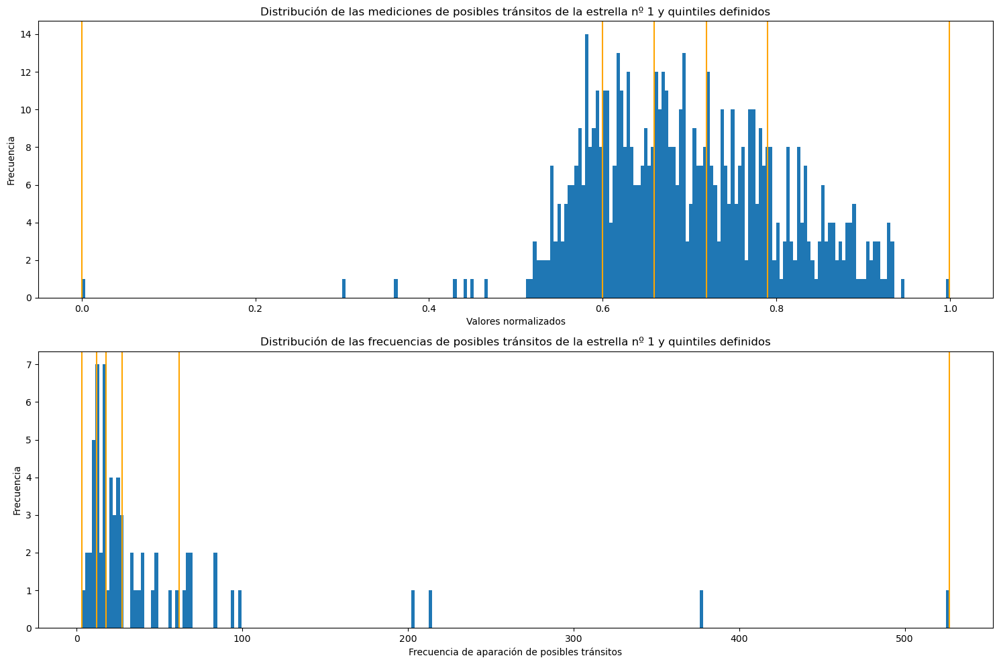

In [39]:
# Distribución de las mediciones de los posibles tránsitos de la primera estrella
fig, ax = plt.subplots(2, 1, figsize=(15, 10))

# Graficar distribución de posibles tránsitos y quintiles
ax[0].set_title('Distribución de las mediciones de posibles tránsitos de la estrella nº {} y quintiles definidos'.format(1))
ax[0].hist(b_train[0], bins=250)
for i in range(15, 21):
    ax[0].axvline(x=b1_train[0][i], c='orange')
ax[0].set_ylabel('Frecuencia')
ax[0].set_xlabel('Valores normalizados')

# Graficar distribución de la frecuencia de posibles tránsitos y quintiles
ax[1].set_title('Distribución de las frecuencias de posibles tránsitos de la estrella nº {} y quintiles definidos'.format(1))
ax[1].hist(b1_train_frec[0], bins=250)
for i in range(5, 11):
    ax[1].axvline(x=b1_train[0][i], c='orange')
ax[1].set_ylabel('Frecuencia')
ax[1].set_xlabel('Frecuencia de aparación de posibles tránsitos')

plt.tight_layout()

### Modelos <a class="anchor" id="5.2.3"></a>

#### Definición
Se construirán y probarán 3 modelos diferentes con las siguientes estructuras:
<ul><b>Modelo con 6 capas ocultas</b>
    <li>Capa de entrada de <b><i>14</i></b> neuronas.</li>
    <li>Capa densa de <b><i>256</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>128</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>64</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>32</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>10</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>8</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa de salida de <b><i>1</i></b> neurona y activación <i>sigmoid</i>.</li>
</ul>
<ul><b>Modelo con 5 capas ocultas</b>
    <li>Capa de entrada de <b><i>14</i></b> neuronas.</li>
    <li>Capa densa de <b><i>256</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>64</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>32</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>10</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>8</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa de salida de <b><i>1</i></b> neurona y activación <i>sigmoid</i>.</li>
</ul>
<ul><b>Modelo con 4 capas ocultas</b>
    <li>Capa de entrada de <b><i>14</i></b> neuronas.</li>
    <li>Capa densa de <b><i>128</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>32</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>10</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa densa de <b><i>8</i></b> neuronas con activación <i>relu</i>.</li>
    <li>Capa de salida de <b><i>1</i></b> neurona y activación <i>sigmoid</i>.</li>
</ul>
En todos ellos se usará como función de pérdida <b><i>binary crossentropy</i></b> y se monitorizarán las métricas <b><i>accuracy</i></b> y <b><i>F1 Score</i></b>.

In [40]:
def get_model_B(b1_train, n):
    v = {6,5,4}
    if n not in v:
        raise ValueError('El número de capas debe estar entre los siguientes: %r.' %v)
    if n==6:
        b = Sequential(name='Estrategia_B_6_capas')
        b.add(Dense(256, input_dim=b1_train.shape[1], activation='relu', name='h1'))
        b.add(Dense(128, activation='relu', name='h2'))
        b.add(Dense(64, activation='relu', name='h3'))
        b.add(Dense(32, activation='relu', name='h4'))
        b.add(Dense(10, activation='relu', name='h5'))
        b.add(Dense(8, activation='relu', name='h6'))
    elif n==5:
        b = Sequential(name='Estrategia_B_5_capas')
        b.add(Dense(256, input_dim=b1_train.shape[1], activation='relu', name='h1'))
        b.add(Dense(64, activation='relu', name='h2'))
        b.add(Dense(32, activation='relu', name='h3'))
        b.add(Dense(10, activation='relu', name='h4'))
        b.add(Dense(8, activation='relu', name='h5'))
    elif n==4:
        b = Sequential(name='Estrategia_B_4_capas')
        b.add(Dense(128, input_dim=b1_train.shape[1], activation='relu', name='h1'))
        b.add(Dense(32, activation='relu', name='h2'))
        b.add(Dense(10, activation='relu', name='h3'))
        b.add(Dense(8, activation='relu', name='h4'))
    
    b.add(Dense(1, activation='sigmoid', name='output'))
    
    return b

#### Entrenamiento
Con cada modelo se testearán diferentes hiperparámetros durante el entrenamiento:
<ul>
    <li><i>Learning rate</i>: <b><i>0.01</i></b>, <b><i>0.001</i></b> y <b><i>0.0001</i></b></li>
    <li>Máx. <i>epochs</i>: <b><i>2500</i></b>. Debido a los callbacks definidos más adelante, no es necesario variar el número de <i>epochs</i>.</li>
    <li><i>Batch size</i>: <b><i>64</i></b> y <b><i>128</i></b></li>
</ul>
Todos los entrenamientos se realizarán con los siguientes <i>callbacks</i>:
<ul>
    <li><i>EarlyStopping</i>: Detendrá el entrenamiento cuando el <i>accuracy</i> con los datos de entrenamiento no mejore durante 200 <i>epochs</i> consecutivos</li>
    <li><i>ModelCheckpoint</i>: Guradará los pesos calculados en la iteración que resulte en un mayor <i>F1 Score</i> con lo datos de validación.</li>
</ul>

In [41]:
def entrenamiento_estrategia_b(train, test, capas, learning_rate, epochs, batch_size, folder):
    '''
    Realiza el entrenamiento del modelo facilitado junto al learning rate,
    número máximo de epochs y tamaño del batch.
    '''
    #Construir modelo
    b = get_model_B(b1_train=train, n=capas)
    
    # Compilar modelo
    b.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=learning_rate), metrics=['accuracy', f1])
    
    # Crear path para salvar los pesos del modelo
    path = (folder + '/' + b.name + '_' + str(learning_rate) + 'LR_' + str(epochs) + 'Epochs_' + str(batch_size) + 'Batch.h5')
    
    # Definir callbacks para que el modelo deje de entrenar cuando el accuracy de validación
    # deje de crecer y guarde el modelo con mejor f1 score
    callbacks = [EarlyStopping(monitor = 'accuracy',
                               mode = 'max',
                               patience = 200
                              ),
                 ModelCheckpoint(filepath = path,
                                 monitor = 'val_f1',
                                 mode = 'max',
                                 save_best_only = True,
                                 save_weights_only = True,
                                )
                ]
    
    # Entrenar
    bfit = b.fit(train, train_augmented_labels,
                 epochs = epochs,
                 validation_data = (test, test_labels),
                 batch_size = batch_size,
                 callbacks = callbacks,
                 verbose = 0)
    
    return b, bfit, path

In [42]:
# Definir parámetros
b_capas = [6,5,4]
lr = [0.01, 0.001, 0.0001]
epochs = 2500
batch = [64, 128]
b_trained_models = []
b_fit_models = []
b_paths = []

# Entrenar todos los modelos y combinaciones de hiperparámetros
for b in b_capas:
    for l in lr:
        for bs in batch:
            print('Entrenando modelo de \033[1m{}\033[0m capas con learning rate \033[1m{}\033[0m y batch size \033[1m{}\033[0m'.format(b, l, bs))
            b_t_m, b_f_m, b_p = entrenamiento_estrategia_b(train=b1_train, test=b1_test, capas=b, learning_rate=l, epochs=epochs, batch_size=bs, folder='Weights B')
            b_trained_models.append(b_t_m)
            b_fit_models.append(b_f_m)
            b_paths.append(b_p)

Entrenando modelo de 6 capas con learning rate 0.01 y batch size 64
Entrenando modelo de 6 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 6 capas con learning rate 0.001 y batch size 64
Entrenando modelo de 6 capas con learning rate 0.001 y batch size 128
Entrenando modelo de 6 capas con learning rate 0.0001 y batch size 64
Entrenando modelo de 6 capas con learning rate 0.0001 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.01 y batch size 64
Entrenando modelo de 5 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.001 y batch size 64
Entrenando modelo de 5 capas con learning rate 0.001 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.0001 y batch size 64
Entrenando modelo de 5 capas con learning rate 0.0001 y batch size 128
Entrenando modelo de 4 capas con learning rate 0.01 y batch size 64
Entrenando modelo de 4 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 4 capas 

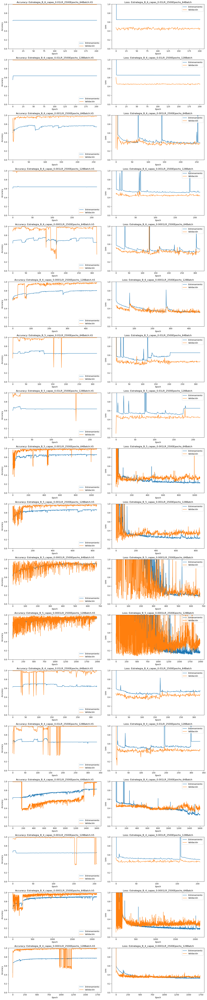

In [43]:
# Plots
fig, ax = plt.subplots(len(b_fit_models), 2, figsize=(15,len(b_fit_models)*4))

for i, bfit in enumerate(b_fit_models):
    ax[i,0].set_title('Accuracy: ' + b_paths[i][10:])
    ax[i,0].plot(bfit.history['accuracy'])
    ax[i,0].plot(bfit.history['val_accuracy'])
    ax[i,0].set_ylabel('Accuracy')
    ax[i,0].set_xlabel('Epoch')
    ax[i,0].set_ylim(0,1)
    ax[i,0].legend(['Entrenamiento', 'Validación'], loc='lower right')
    
    ax[i,1].set_title('Loss: ' + b_paths[i][10:-3])
    ax[i,1].plot(bfit.history['loss'])
    ax[i,1].plot(bfit.history['val_loss'])
    ax[i,1].set_ylabel('Loss')
    ax[i,1].set_xlabel('Epoch')
    ax[i,1].set_ylim(0,1)
    ax[i,1].legend(['Entrenamiento', 'Validación'], loc='upper right')

plt.tight_layout()

### Resultados <a class="anchor" id="5.2.4"></a>
A continuación se muestras las matrices de confusión de las predicciones de los modelos entrenados con cada combinación de hiperparámetros.

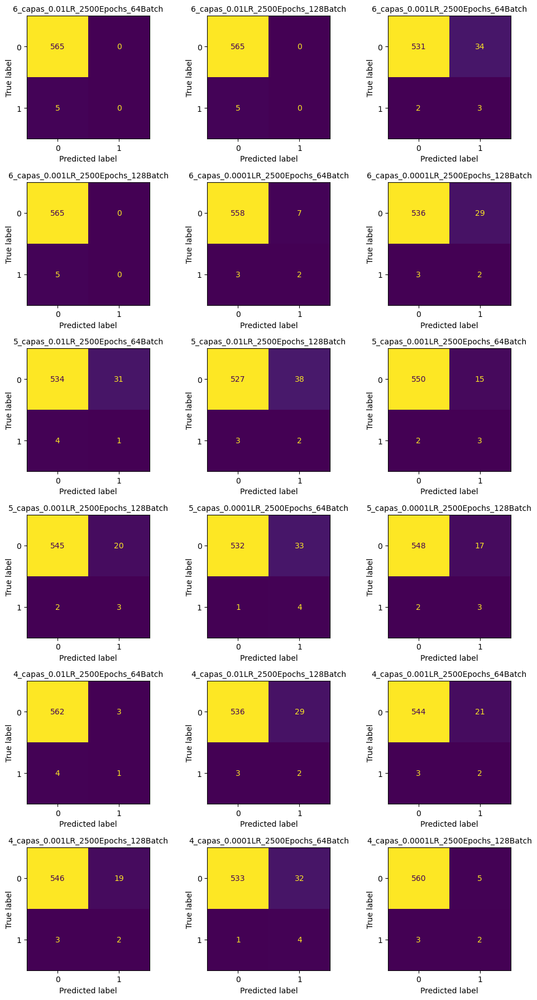

In [44]:
# Confusion matrix
fig, ax = plt.subplots(int(len(b_trained_models)/3), 3, figsize=(10,len(b_trained_models)))
ax=ax.flatten()
b_f1 = []

for i, b in enumerate(b_trained_models):
    b.load_weights(b_paths[i])
    b_test_predicted = np.round(b.predict(b1_test, verbose=0),0)
    b_f1.append(f1_score(test_labels,b_test_predicted))
    cm = confusion_matrix(test_labels, b_test_predicted)
    
    ax[i].set_title(b_paths[i][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax[i], colorbar=False)
    
plt.tight_layout()

In [45]:
for i, b in enumerate(b_trained_models):
    b.load_weights(b_paths[i])
    b_test_predicted = np.round(b.predict(b1_test, verbose=0),0)
    print('\033[1m{}\033[0m'.format(b_paths[i][23:-3]), end='\t')
    print("Accuracy:\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,b_test_predicted)*100), end='\t')
    print("Precision:\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,b_test_predicted)*100), end='\t  ')
    print("Recall:\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,b_test_predicted)*100), end='\t')
    print("F1 Score:\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,b_test_predicted)*100), end = '')

6_capas_0.01LR_2500Epochs_64Batch	Accuracy:99.1%	Precision:0.0%	  Recall:0.0%	F1 Score:0.0%
6_capas_0.01LR_2500Epochs_128Batch	Accuracy:99.1%	Precision:0.0%	  Recall:0.0%	F1 Score:0.0%
6_capas_0.001LR_2500Epochs_64Batch	Accuracy:93.7%	Precision:8.1%	  Recall:60.0%	F1 Score:14.3%
6_capas_0.001LR_2500Epochs_128Batch	Accuracy:99.1%	Precision:0.0%	  Recall:0.0%	F1 Score:0.0%
6_capas_0.0001LR_2500Epochs_64Batch	Accuracy:98.2%	Precision:22.2%	  Recall:40.0%	F1 Score:28.6%
6_capas_0.0001LR_2500Epochs_128Batch	Accuracy:94.4%	Precision:6.5%	  Recall:40.0%	F1 Score:11.1%
5_capas_0.01LR_2500Epochs_64Batch	Accuracy:93.9%	Precision:3.1%	  Recall:20.0%	F1 Score:5.4%
5_capas_0.01LR_2500Epochs_128Batch	Accuracy:92.8%	Precision:5.0%	  Recall:40.0%	F1 Score:8.9%
5_capas_0.001LR_2500Epochs_64Batch	Accuracy:97.0%	Precision:16.7%	  Recall:60.0%	F1 Score:26.1%
5_capas_0.001LR_2500Epochs_128Batch	Accuracy:96.1%	Precision:13.0%	  Recall:60.0%	F1 Score:21.4%
5_capas_0.0001LR_2500Epochs_64Batch	Accuracy:94.0%	P

#### Mejor modelo
Al igual que con la Estrategia A, se utilizará el <i>F1 Score</i> como criterio para discernir cuál es el mejor de los modelos anteriores. Esto se debe a que esta métrica es la que mejor refleja el rendimiento de los modelos a la hora de clasificar los positivos.

In [46]:
b_best_id = np.argwhere(b_f1 == max(b_f1))
b_best = []
b_best_path = []

if len(b_best_id) > 1:
    print('Los mejores modelos con el mismo F1 Score son:')
else:
    print('El mejor modelo es:')

for i in b_best_id:
    b_best.append(b_trained_models[i[0]])
    b_best_path.append(b_paths[i[0]])
    print('\033[1m{}\033[0m'.format(b_best_path[-1][23:-3]))

El mejor modelo es:
4_capas_0.0001LR_2500Epochs_128Batch


In [47]:
for i, b in enumerate(b_best):
    b_test_predicted = np.round(b.predict(b1_test, verbose=0),0)
    
    print("MODELO: \033[1m{}\033[0m".format(b_best_path[i][23:-3]))
    print("Accuracy:\t\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,b_test_predicted)*100))
    print("Precision:\t\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,b_test_predicted)*100))
    print("Recall:\t\t\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,b_test_predicted)*100))
    print("F1 Score:\t\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,b_test_predicted)*100))
    print(classification_report(test_labels, b_test_predicted), end='\n\n\n')

MODELO: 4_capas_0.0001LR_2500Epochs_128Batch
Accuracy:	98.6%
Precision:	28.6%
Recall:		40.0%
F1 Score:	33.3%

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       565
           1       0.29      0.40      0.33         5

    accuracy                           0.99       570
   macro avg       0.64      0.70      0.66       570
weighted avg       0.99      0.99      0.99       570





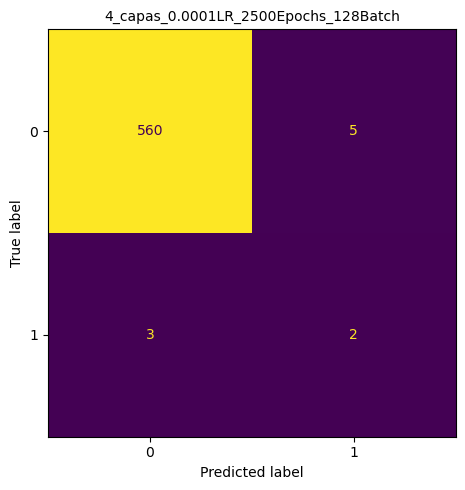

In [48]:
# Confusion matrix
if len(b_best) > 1:
    fig, ax = plt.subplots(int(len(b_best)), 1, figsize=(10,len(b_trained_models)/2))
    ax=ax.flatten()
    
    for i, b in enumerate(b_best):
        b_test_predicted = np.round(b.predict(b1_test, verbose=0),0)
        cm = confusion_matrix(test_labels, b_test_predicted)
        
        ax[i].set_title(b_best_path[i][23:-3], fontsize=10)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp = disp.plot(ax=ax[i], colorbar=False)

else:
    fig, ax = plt.subplots(1, 1, figsize=(10,5))
    
    b_test_predicted = np.round(b_best[0].predict(b1_test, verbose=0),0)
    cm = confusion_matrix(test_labels, b_test_predicted)
    
    ax.set_title(b_best_path[0][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax, colorbar=False)

plt.tight_layout()

## Estrategia C - Mecanismo de atención <a class="anchor" id="5.3"></a>
Esta estrategia consiste en obtener un vector <i>atención</i> que pondere cada una de las dimensiones en base a la probabilidad de ser un tránsito y repetir las estrategias A y B.

### Vector atención <a class="anchor" id="5.3.1"></a>
Se calcula el vector atención, que se puede entender como la normalización entre el rango [0,1] de los valores de las mediciones que se encuentran por debajo de un <i>threshold</i> definido.

In [49]:
def estrategiaC_vector_atencion(f, n = 250):
    '''
    Calcula el vector atención en función de los valores de las mediciones pasadas por parámetro.
    Cada valor del vector atención se calcula de la siguiente manera:
    
                        /= (valor_medición - mínimo) / (threshold - minimo) si valor_medición <= threshold
        valor_atención-|
                        \= 1 si valor_medición > threshold
    
    donde
    
        mínimo = (valor mínimo de las n mediciones más cercanas a valor_medición)
    
    y
    
        threshold = media * (1 - desviación_estándard)
    
    donde
    
        media = (valor medio de las n mediciones más cercanas a valor_medición)
    
    y
    
        desviación_estándard = (desviación estándard de las n mediciones más cercanas a valor_medición)
    
    El vector atención se puede entender como la normalización entre el rango [0,1] de los valores de las
    mediciones que se encuentran por debajo del threshold.
    '''
    vector_atencion = []
    medias = []
    desviaciones = []
    thresholds = []
    
    # Recorrer array
    for i, v in enumerate(f):
        
        # Obtener ventana de n vecinos más cercanos
        if i <= n/2:
            ventana = f[:n]
        elif i >= (len(f) - n):
            ventana = f[-n:]
        else:
            ventana = f[int(i-(n/2)):int(i+(n/2))]
        
        # Obtener media, mínimo, desv_std y threshold
        media = np.mean(ventana)
        minimo = np.min(ventana)
        desv_std = np.std(ventana)
        threshold = media * (1-desv_std)
        
        # Calcular componente del vector atención
        if v <= threshold:
            atencion = (v - minimo) / (threshold - minimo)
        else:
            atencion = 1
        
        # Agregar componente al vector atención
        vector_atencion.append(atencion)
        
        # Almacenar cálculos
        medias.append(media)
        desviaciones.append(desv_std)
        thresholds.append(threshold)
    
    vector_atencion = np.array(vector_atencion)
    
    return vector_atencion, medias, desviaciones, thresholds

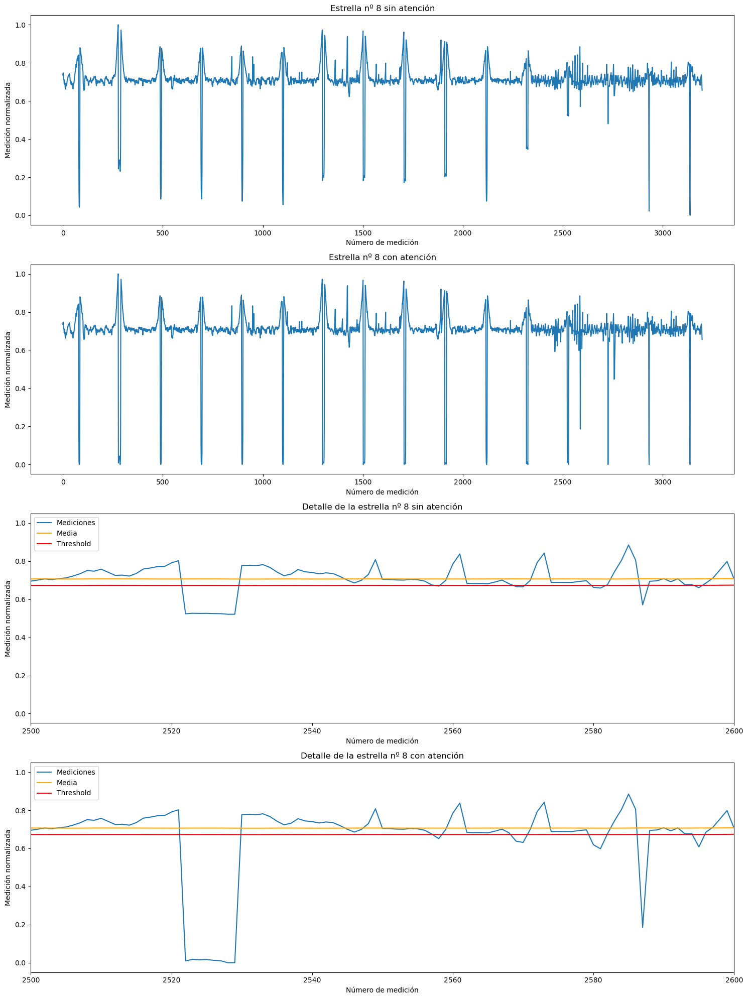

In [50]:
# Ejemplo gráfico
i = 7
f = train_augmented[i]
n = 250
zoom = (2500, 2600)
v, medias, desviaciones, thresholds = estrategiaC_vector_atencion(f,n)
vf = v*f
desv = np.std(f[zoom[0]:zoom[1]])
media = np.mean(f[zoom[0]:zoom[1]])
threshold = media * (1-desv)

fig, ax = plt.subplots(4, 1, figsize=(15, 20))

# Graficar estrella sin atención
ax[0].set_title('Estrella nº {} sin atención'.format(i+1))
ax[0].plot(f)
ax[0].set_xlabel('Número de medición')
ax[0].set_ylabel('Medición normalizada')

# Graficar estrella con atención
ax[1].set_title('Estrella nº {} con atención'.format(i+1))
ax[1].plot(vf)
ax[1].set_xlabel('Número de medición')
ax[1].set_ylabel('Medición normalizada')

# Graficar estrella sin atención con zoom
ax[2].set_title('Detalle de la estrella nº {} sin atención'.format(i+1))
ax[2].plot(f)
ax[2].plot(medias, c='orange')
ax[2].plot(thresholds, c='red')
ax[2].set_xlabel('Número de medición')
ax[2].set_ylabel('Medición normalizada')
ax[2].set_xlim(zoom)
ax[2].legend(['Mediciones','Media', 'Threshold'], loc='upper left')

# Graficar estrella con atención con zoom
ax[3].set_title('Detalle de la estrella nº {} con atención'.format(i+1))
ax[3].plot(vf)
ax[3].plot(medias, c='orange')
ax[3].plot(thresholds, c='red')
ax[3].set_xlabel('Número de medición')
ax[3].set_ylabel('Medición normalizada')
ax[3].set_xlim(zoom)
ax[3].legend(['Mediciones','Media', 'Threshold'], loc='upper left')

plt.tight_layout()

#### Aplicar a todo el dataset
Se aplica el mecanismo de atención a los datos de entrenamiento y de test; es decir, se calcula cada uno de los vectores atención y se ponderan los datos.

In [51]:
# Dataset de entrenamiento
c_train = []
c_train_atencion = []

print('\033[1mDATASET DE ENTRENAMIENTO\033[0m')
for i, f in enumerate(train_augmented):
    print('Fila {} de {}'.format(i+1, len(train_augmented)), end='\r')
    c_t_a,_,_,_ = estrategiaC_vector_atencion(f)
    c_train_atencion.append(c_t_a)
    ponderado = c_t_a * f
    c_train.append(ponderado)

c_train = np.array(c_train)
c_train_atencion = np.array(c_train_atencion)

# Dataset de test
c_test = []
c_test_atencion = []

print('\n\n\033[1mDATASET DE TEST\033[0m')
for i, f in enumerate(test):
    print('Fila {} de {}'.format(i+1, len(test)), end='\r')
    c_t_a,_,_,_ = estrategiaC_vector_atencion(f)
    c_test_atencion.append(c_t_a)
    ponderado = c_t_a * f
    c_test.append(ponderado)

c_test = np.array(c_test)
c_test_atencion = np.array(c_test_atencion)

DATASET DE ENTRENAMIENTO
Fila 7899 de 7899

DATASET DE TEST


### Estrategia C<sub>A</sub> - Distribuciones con mecanismo de atención <a class="anchor" id="5.3.2"></a>
Esta sub-estrategia consiste en volver a implementar la <b>Estrategia A</b> con el mecanismo de atención.

#### Datos<a class="anchor" id="5.3.2.1"></a>
Se genera el nuevo dataset con las medidas de las distribuciones a partir de los datos ponderados por los vectores atención.

In [52]:
# Entrenamiento
ca_train = estrategiaA_datos(c_train)

#Test
ca_test = estrategiaA_datos(c_test)

#### Modelos <a class="anchor" id="5.3.2.2"></a>
Las combinaciones de modelos e hiperparámetros se mantienen invariantes con respecto a los de la Estrategia A.

In [53]:
# Definir parámetros
ca_capas = [5, 4, 3]
lr = [0.01, 0.001, 0.0001]
epochs = 1500
batch = [128, 256]
ca_trained_models = []
ca_fit_models = []
ca_paths = []

# Entrenar todos los modelos y combinaciones de hiperparámetros
for a in ca_capas:
    for l in lr:
        for b in batch:
            print('Entrenando modelo de \033[1m{}\033[0m capas con learning rate \033[1m{}\033[0m y batch size \033[1m{}\033[0m'.format(a, l, b))
            ca_t_m, ca_f_m, ca_p = entrenamiento_estrategia_a(train=ca_train, test=ca_test, capas=a, learning_rate=l, epochs=epochs, batch_size=b, folder='Weights CA')
            ca_trained_models.append(ca_t_m)
            ca_fit_models.append(ca_f_m)
            ca_paths.append(ca_p)

Entrenando modelo de 5 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.01 y batch size 256
Entrenando modelo de 5 capas con learning rate 0.001 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.001 y batch size 256
Entrenando modelo de 5 capas con learning rate 0.0001 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.0001 y batch size 256
Entrenando modelo de 4 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 4 capas con learning rate 0.01 y batch size 256
Entrenando modelo de 4 capas con learning rate 0.001 y batch size 128
Entrenando modelo de 4 capas con learning rate 0.001 y batch size 256
Entrenando modelo de 4 capas con learning rate 0.0001 y batch size 128
Entrenando modelo de 4 capas con learning rate 0.0001 y batch size 256
Entrenando modelo de 3 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 3 capas con learning rate 0.01 y batch size 256
Entrenando modelo de 3

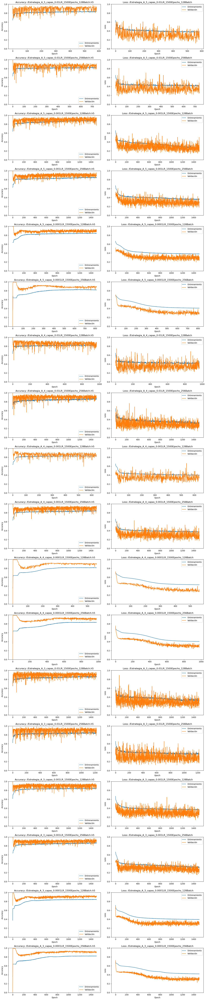

In [54]:
# Plots
fig, ax = plt.subplots(len(ca_fit_models), 2, figsize=(15,len(ca_fit_models)*4))

for i, cafit in enumerate(ca_fit_models):
    ax[i,0].set_title('Accuracy: ' + ca_paths[i][10:])
    ax[i,0].plot(cafit.history['accuracy'])
    ax[i,0].plot(cafit.history['val_accuracy'])
    ax[i,0].set_ylabel('Accuracy')
    ax[i,0].set_xlabel('Epoch')
    ax[i,0].set_ylim(0,1)
    ax[i,0].legend(['Entrenamiento', 'Validación'], loc='lower right')
    
    ax[i,1].set_title('Loss: ' + ca_paths[i][10:-3])
    ax[i,1].plot(cafit.history['loss'])
    ax[i,1].plot(cafit.history['val_loss'])
    ax[i,1].set_ylabel('Loss')
    ax[i,1].set_xlabel('Epoch')
    ax[i,1].set_ylim(0,1)
    ax[i,1].legend(['Entrenamiento', 'Validación'], loc='upper right')

plt.tight_layout()

#### Resultados <a class="anchor" id="5.3.2.3"></a>
A continuación se muestras las matrices de confusión de las predicciones de los modelos entrenados con cada combinación de hiperparámetros.

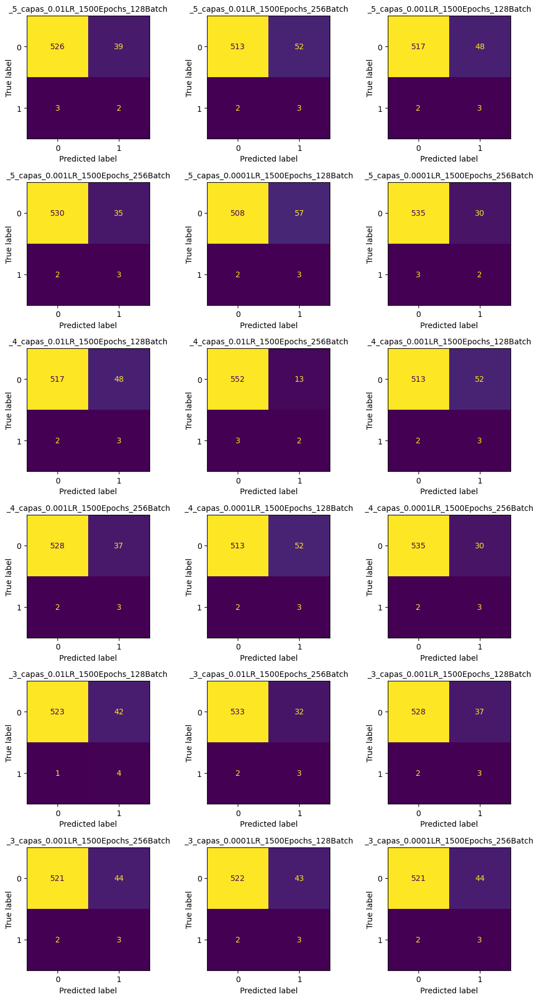

In [55]:
# Confusion matrix
fig, ax = plt.subplots(int(len(ca_trained_models)/3), 3, figsize=(10,len(ca_trained_models)))
ax=ax.flatten()
ca_f1 = []

for i, a in enumerate(ca_trained_models):
    a.load_weights(ca_paths[i])
    ca_test_predicted = np.round(a.predict(ca_test, verbose=0),0)
    ca_f1.append(f1_score(test_labels,ca_test_predicted))
    cm = confusion_matrix(test_labels, ca_test_predicted)
    
    ax[i].set_title(ca_paths[i][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax[i], colorbar=False)
    
plt.tight_layout()

In [56]:
for i, a in enumerate(ca_trained_models):
    a.load_weights(ca_paths[i])
    ca_test_predicted = np.round(a.predict(ca_test, verbose=0),0)
    print('\033[1m{}\033[0m'.format(ca_paths[i][23:-3]), end='\t')
    print("Accuracy:\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,ca_test_predicted)*100), end='\t')
    print("Precision:\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,ca_test_predicted)*100), end='\t  ')
    print("Recall:\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,ca_test_predicted)*100), end='\t')
    print("F1 Score:\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,ca_test_predicted)*100), end = '')

_5_capas_0.01LR_1500Epochs_128Batch	Accuracy:92.6%	Precision:4.9%	  Recall:40.0%	F1 Score:8.7%
_5_capas_0.01LR_1500Epochs_256Batch	Accuracy:90.5%	Precision:5.5%	  Recall:60.0%	F1 Score:10.0%
_5_capas_0.001LR_1500Epochs_128Batch	Accuracy:91.2%	Precision:5.9%	  Recall:60.0%	F1 Score:10.7%
_5_capas_0.001LR_1500Epochs_256Batch	Accuracy:93.5%	Precision:7.9%	  Recall:60.0%	F1 Score:14.0%
_5_capas_0.0001LR_1500Epochs_128Batch	Accuracy:89.6%	Precision:5.0%	  Recall:60.0%	F1 Score:9.2%
_5_capas_0.0001LR_1500Epochs_256Batch	Accuracy:94.2%	Precision:6.2%	  Recall:40.0%	F1 Score:10.8%
_4_capas_0.01LR_1500Epochs_128Batch	Accuracy:91.2%	Precision:5.9%	  Recall:60.0%	F1 Score:10.7%
_4_capas_0.01LR_1500Epochs_256Batch	Accuracy:97.2%	Precision:13.3%	  Recall:40.0%	F1 Score:20.0%
_4_capas_0.001LR_1500Epochs_128Batch	Accuracy:90.5%	Precision:5.5%	  Recall:60.0%	F1 Score:10.0%
_4_capas_0.001LR_1500Epochs_256Batch	Accuracy:93.2%	Precision:7.5%	  Recall:60.0%	F1 Score:13.3%
_4_capas_0.0001LR_1500Epochs_128B

#### Mejor modelo
Siguiendo el mismo criterio que en la Estrategia A, se utilizará el <i>F1 Score</i> como criterio para discernir cuál es el mejor de los modelos anteriores. Esto se debe a que esta métrica es la que mejor refleja el rendimiento de los modelos a la hora de clasificar los positivos.

In [57]:
ca_best_id = np.argwhere(ca_f1 == max(ca_f1))
ca_best = []
ca_best_path = []

if len(ca_best_id) > 1:
    print('Los mejores modelos con el mismo F1 Score son:')
else:
    print('El mejor modelo es:')

for i in ca_best_id:
    ca_best.append(ca_trained_models[i[0]])
    ca_best_path.append(ca_paths[i[0]])
    print('\033[1m{}\033[0m'.format(ca_best_path[-1][23:-3]))

El mejor modelo es:
_4_capas_0.01LR_1500Epochs_256Batch


In [58]:
for i, a in enumerate(ca_best):
    ca_test_predicted = np.round(a.predict(ca_test, verbose=0),0)
    
    print("MODELO: \033[1m{}\033[0m".format(ca_best_path[i][23:-3]))
    print("Accuracy:\t\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,ca_test_predicted)*100))
    print("Precision:\t\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,ca_test_predicted)*100))
    print("Recall:\t\t\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,ca_test_predicted)*100))
    print("F1 Score:\t\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,ca_test_predicted)*100))
    print(classification_report(test_labels, ca_test_predicted), end='\n\n\n')

MODELO: _4_capas_0.01LR_1500Epochs_256Batch
Accuracy:	97.2%
Precision:	13.3%
Recall:		40.0%
F1 Score:	20.0%

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       565
           1       0.13      0.40      0.20         5

    accuracy                           0.97       570
   macro avg       0.56      0.69      0.59       570
weighted avg       0.99      0.97      0.98       570





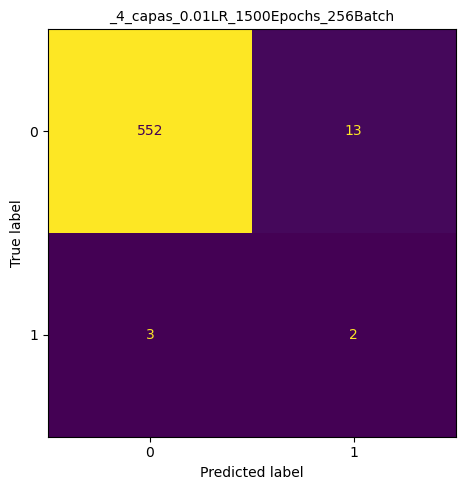

In [59]:
# Confusion matrix
if len(ca_best) > 1:
    fig, ax = plt.subplots(int(len(ca_best)), 1, figsize=(10,len(ca_trained_models)/2))
    ax=ax.flatten()
    
    for i, a in enumerate(ca_best):
        ca_test_predicted = np.round(a.predict(ca_test, verbose=0),0)
        cm = confusion_matrix(test_labels, ca_test_predicted)
        
        ax[i].set_title(ca_best_path[i][23:-3], fontsize=10)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp = disp.plot(ax=ax[i], colorbar=False)

else:
    fig, ax = plt.subplots(1, 1, figsize=(10,5))
    
    ca_test_predicted = np.round(ca_best[0].predict(ca_test, verbose=0),0)
    cm = confusion_matrix(test_labels, ca_test_predicted)
    
    ax.set_title(ca_best_path[0][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax, colorbar=False)

plt.tight_layout()

### Estrategia C<sub>B</sub> - Selección de dimensionalidad con mecanismo de atención <a class="anchor" id="5.3.3"></a>
Esta sub-estrategia consiste en volver a implementar la <b>Estrategia B</b> con el mecanismo de atención.

#### Datos <a class="anchor" id="5.3.3.1"></a>
Se genera el nuevo dataset con las medidas de las distribuciones y frecuencias de los posibles tránsitos a partir de los datos ponderados por los vectores atención.

Número de posibles tránsitos detectados: 28


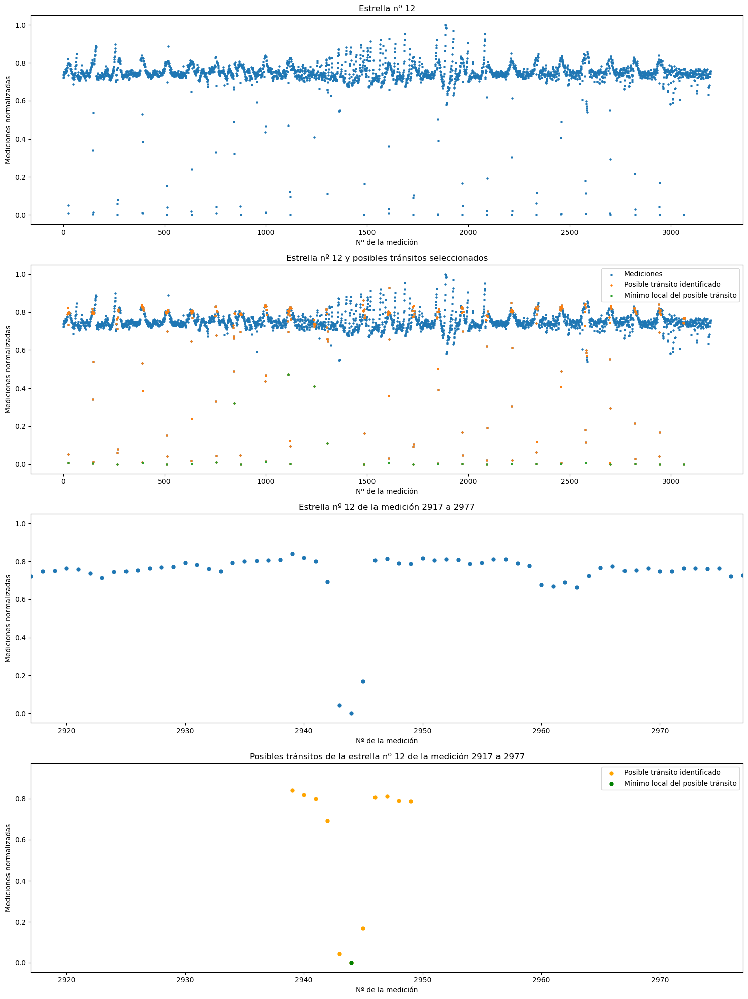

In [60]:
# Seleccionar estrella de ejemplo
estrella = 11

# Obtener vectores de mediciones y posiciones
t, p, u = estrategiaB_datos(c_train[estrella], sigma = 0.70, w = 8)

# Graficar
fig, ax = plt.subplots(4, 1, figsize=(15, 20))
xlim = (2917,2977)
s1 = 5
s2 = 25

# Estrella de ejemplo completa
ax[0].set_title('Estrella nº {}'.format(estrella+1))
ax[0].scatter(range(len(c_train[estrella])), c_train[estrella], s=s1)
ax[0].set_xlabel('Nº de la medición')
ax[0].set_ylabel('Mediciones normalizadas')

# Estrella de ejemplo completa junto a las dimensiones seleccionadas
ax[1].set_title('Estrella nº {} y posibles tránsitos seleccionados'.format(estrella+1))
ax[1].scatter(range(len(c_train[0])), c_train[estrella], s=s1)
ax[1].scatter(p, t, s=s1)
ax[1].scatter(u, c_train[estrella][u], s=s1)
ax[1].set_xlabel('Nº de la medición')
ax[1].set_ylabel('Mediciones normalizadas')
ax[1].legend(['Mediciones', 'Posible tránsito identificado', 'Mínimo local del posible tránsito'])

# Zoom en estrella de ejemplo completa
ax[2].set_title('Estrella nº {} de la medición {} a {}'.format(estrella+1, xlim[0], xlim[1]))
ax[2].scatter(range(len(c_train[0])), c_train[estrella], s=s2)
ax[2].set_xlabel('Nº de la medición')
ax[2].set_ylabel('Mediciones normalizadas')
ax[2].set_xlim(xlim)

# Zoom en las dimensiones seleccionadas de la estrella de ejemplo
ax[3].set_title('Posibles tránsitos de la estrella nº {} de la medición {} a {}'.format(estrella+1, xlim[0], xlim[1]))
ax[3].scatter(p, t, s=s2, c='orange')
ax[3].scatter(u, c_train[estrella][u], s=s2, c='green')
ax[3].set_xlabel('Nº de la medición')
ax[3].set_ylabel('Mediciones normalizadas')
ax[3].set_xlim(xlim)
ax[3].legend(['Posible tránsito identificado', 'Mínimo local del posible tránsito'])

plt.tight_layout()
print('Número de posibles tránsitos detectados: \033[1m{}\033[0m'.format(len(u)))

In [61]:
# Dataset de entrenamiento
cb_train = []
cb_train_positions = []
cb_train_unique = []

print('\033[1mDATASET DE ENTRENAMIENTO\033[0m')
for c, i in enumerate(c_train):
    print('Fila {} de {}'.format(c+1, len(c_train)), end='\r')
    cb_t, cb_t_p, cb_t_u = estrategiaB_datos(i, sigma = 0.70, w = 8)
    cb_train.append(cb_t)
    cb_train_positions.append(cb_t_p)
    cb_train_unique.append(cb_t_u)

# Dataset de test
cb_test = []
cb_test_positions = []
cb_test_unique = []

print('\n\n\033[1mDATASET DE TEST\033[0m')
for c, i in enumerate(c_test):
    print('Fila {} de {}'.format(c+1, len(c_test)), end='\r')
    cb_t, cb_t_p, cb_t_u = estrategiaB_datos(i)
    cb_test.append(cb_t)
    cb_test_positions.append(cb_t_p)
    cb_test_unique.append(cb_t_u)

DATASET DE ENTRENAMIENTO
Fila 7899 de 7899

DATASET DE TEST


In [62]:
# Entrenamiento
cb1_train = []
cb1_train_frec = []
print('\033[1mDATOS DE ENTRENAMIENTO\033[0m')
for i in range(len(cb_train)):
    print('Fila {} de {}'.format(i+1, len(cb_train)), end='\r')
    cb1_t, cb1_f = estrategiaB_distribuciones(cb_train[i], cb_train_unique[i])
    cb1_train.append(cb1_t)
    cb1_train_frec.append(cb1_f)

cb1_train = np.array(cb1_train)
cb1_train_frec = np.array(cb1_train_frec)

# Test
cb1_test = []
cb1_test_frec = []
print('\n\n\033[1mDATOS DE TEST\033[0m')
for i in range(len(cb_test)):
    print('Fila {} de {}'.format(i+1, len(cb_test)), end='\r')
    cb1_t, cb1_f = estrategiaB_distribuciones(cb_test[i], cb_test_unique[i])
    cb1_test.append(cb1_t)
    cb1_test_frec.append(cb1_f)

cb1_test = np.array(cb1_test)
cb1_test_frec = np.array(cb1_test_frec)

DATOS DE ENTRENAMIENTO
Fila 7899 de 7899

DATOS DE TEST


#### Modelos <a class="anchor" id="5.3.3.2"></a>
Las combinaciones de modelos e hiperparámetros se mantienen invariantes con respecto a los de la Estrategia B.

In [63]:
# Definir parámetros
cb_capas = [6,5,4]
lr = [0.01, 0.001, 0.0001]
epochs = 2500
batch = [64, 128]
cb_trained_models = []
cb_fit_models = []
cb_paths = []

# Entrenar todos los modelos y combinaciones de hiperparámetros
for b in cb_capas:
    for l in lr:
        for bs in batch:
            print('Entrenando modelo de \033[1m{}\033[0m capas con learning rate \033[1m{}\033[0m y batch size \033[1m{}\033[0m'.format(b, l, bs))
            cb_t_m, cb_f_m, cb_p = entrenamiento_estrategia_b(train=cb1_train, test=cb1_test, capas=b, learning_rate=l, epochs=epochs, batch_size=bs, folder='Weights CB')
            cb_trained_models.append(cb_t_m)
            cb_fit_models.append(cb_f_m)
            cb_paths.append(cb_p)

Entrenando modelo de 6 capas con learning rate 0.01 y batch size 64
Entrenando modelo de 6 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 6 capas con learning rate 0.001 y batch size 64
Entrenando modelo de 6 capas con learning rate 0.001 y batch size 128
Entrenando modelo de 6 capas con learning rate 0.0001 y batch size 64
Entrenando modelo de 6 capas con learning rate 0.0001 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.01 y batch size 64
Entrenando modelo de 5 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.001 y batch size 64
Entrenando modelo de 5 capas con learning rate 0.001 y batch size 128
Entrenando modelo de 5 capas con learning rate 0.0001 y batch size 64
Entrenando modelo de 5 capas con learning rate 0.0001 y batch size 128
Entrenando modelo de 4 capas con learning rate 0.01 y batch size 64
Entrenando modelo de 4 capas con learning rate 0.01 y batch size 128
Entrenando modelo de 4 capas 

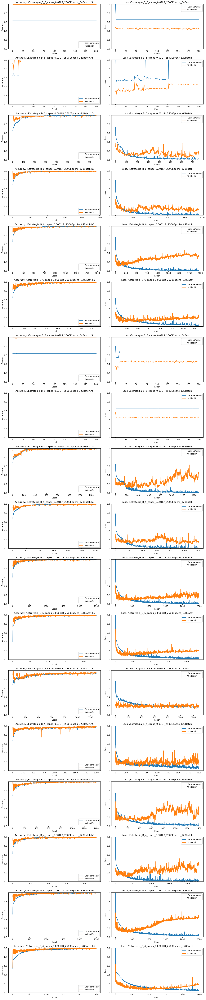

In [64]:
# Plots
fig, ax = plt.subplots(len(cb_fit_models), 2, figsize=(15,len(cb_fit_models)*4))

for i, cbfit in enumerate(cb_fit_models):
    ax[i,0].set_title('Accuracy: ' + cb_paths[i][10:])
    ax[i,0].plot(cbfit.history['accuracy'])
    ax[i,0].plot(cbfit.history['val_accuracy'])
    ax[i,0].set_ylabel('Accuracy')
    ax[i,0].set_xlabel('Epoch')
    ax[i,0].set_ylim(0,1)
    ax[i,0].legend(['Entrenamiento', 'Validación'], loc='lower right')
    
    ax[i,1].set_title('Loss: ' + cb_paths[i][10:-3])
    ax[i,1].plot(cbfit.history['loss'])
    ax[i,1].plot(cbfit.history['val_loss'])
    ax[i,1].set_ylabel('Loss')
    ax[i,1].set_xlabel('Epoch')
    ax[i,1].set_ylim(0,1)
    ax[i,1].legend(['Entrenamiento', 'Validación'], loc='upper right')

plt.tight_layout()

#### Resultados <a class="anchor" id="5.3.3.3"></a>
A continuación se muestras las matrices de confusión de las predicciones de los modelos entrenados con cada combinación de hiperparámetros.

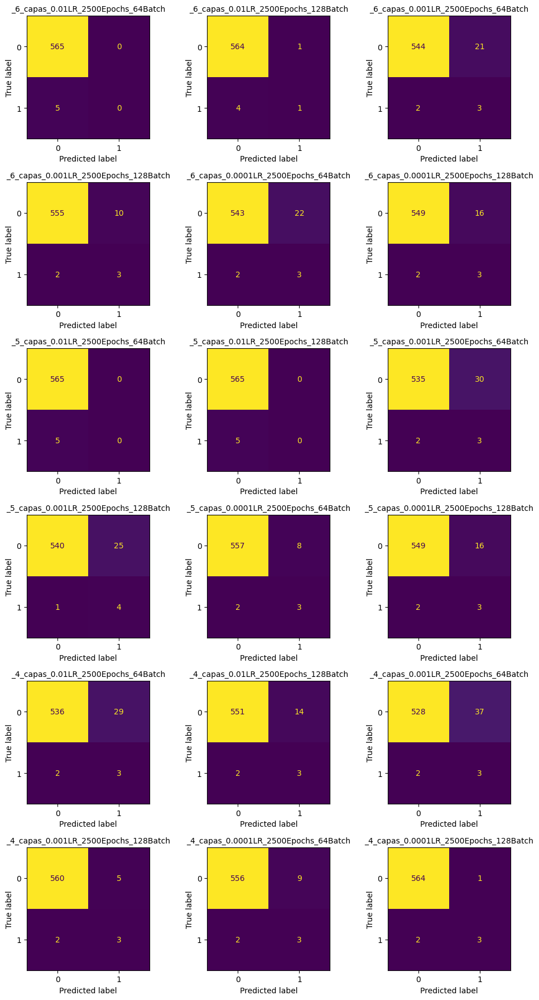

In [65]:
# Confusion matrix
fig, ax = plt.subplots(int(len(cb_trained_models)/3), 3, figsize=(10,len(cb_trained_models)))
ax=ax.flatten()
cb_f1 = []

for i, b in enumerate(cb_trained_models):
    b.load_weights(cb_paths[i])
    cb_test_predicted = np.round(b.predict(cb1_test, verbose=0),0)
    cb_f1.append(f1_score(test_labels,cb_test_predicted))
    cm = confusion_matrix(test_labels, cb_test_predicted)
    
    ax[i].set_title(cb_paths[i][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax[i], colorbar=False)
    
plt.tight_layout()

In [66]:
for i, b in enumerate(cb_trained_models):
    b.load_weights(cb_paths[i])
    cb_test_predicted = np.round(b.predict(cb1_test, verbose=0),0)
    print('\033[1m{}\033[0m'.format(cb_paths[i][23:-3]), end='\t')
    print("Accuracy:\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,cb_test_predicted)*100), end='\t')
    print("Precision:\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,cb_test_predicted)*100), end='\t  ')
    print("Recall:\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,cb_test_predicted)*100), end='\t')
    print("F1 Score:\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,cb_test_predicted)*100), end = '')

_6_capas_0.01LR_2500Epochs_64Batch	Accuracy:99.1%	Precision:0.0%	  Recall:0.0%	F1 Score:0.0%
_6_capas_0.01LR_2500Epochs_128Batch	Accuracy:99.1%	Precision:50.0%	  Recall:20.0%	F1 Score:28.6%
_6_capas_0.001LR_2500Epochs_64Batch	Accuracy:96.0%	Precision:12.5%	  Recall:60.0%	F1 Score:20.7%
_6_capas_0.001LR_2500Epochs_128Batch	Accuracy:97.9%	Precision:23.1%	  Recall:60.0%	F1 Score:33.3%
_6_capas_0.0001LR_2500Epochs_64Batch	Accuracy:95.8%	Precision:12.0%	  Recall:60.0%	F1 Score:20.0%
_6_capas_0.0001LR_2500Epochs_128Batch	Accuracy:96.8%	Precision:15.8%	  Recall:60.0%	F1 Score:25.0%
_5_capas_0.01LR_2500Epochs_64Batch	Accuracy:99.1%	Precision:0.0%	  Recall:0.0%	F1 Score:0.0%
_5_capas_0.01LR_2500Epochs_128Batch	Accuracy:99.1%	Precision:0.0%	  Recall:0.0%	F1 Score:0.0%
_5_capas_0.001LR_2500Epochs_64Batch	Accuracy:94.4%	Precision:9.1%	  Recall:60.0%	F1 Score:15.8%
_5_capas_0.001LR_2500Epochs_128Batch	Accuracy:95.4%	Precision:13.8%	  Recall:80.0%	F1 Score:23.5%
_5_capas_0.0001LR_2500Epochs_64Batch	

#### Mejor modelo
Al igual que con la Estrategia B, se utilizará el <i>F1 Score</i> como criterio para discernir cuál es el mejor de los modelos anteriores. Esto se debe a que esta métrica es la que mejor refleja el rendimiento de los modelos a la hora de clasificar los positivos.

In [67]:
cb_best_id = np.argwhere(cb_f1 == max(cb_f1))
cb_best = []
cb_best_path = []

if len(cb_best_id) > 1:
    print('Los mejores modelos con el mismo F1 Score son:')
else:
    print('El mejor modelo es:')

for i in cb_best_id:
    cb_best.append(cb_trained_models[i[0]])
    cb_best_path.append(cb_paths[i[0]])
    print('\033[1m{}\033[0m'.format(cb_best_path[-1][23:-3]))

El mejor modelo es:
_4_capas_0.0001LR_2500Epochs_128Batch


In [68]:
for i, b in enumerate(cb_best):
    cb_test_predicted = np.round(b.predict(cb1_test, verbose=0),0)
    
    print("MODELO: \033[1m{}\033[0m".format(cb_best_path[i][23:-3]))
    print("Accuracy:\t\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,cb_test_predicted)*100))
    print("Precision:\t\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,cb_test_predicted)*100))
    print("Recall:\t\t\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,cb_test_predicted)*100))
    print("F1 Score:\t\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,cb_test_predicted)*100))
    print(classification_report(test_labels, cb_test_predicted), end='\n\n\n')

MODELO: _4_capas_0.0001LR_2500Epochs_128Batch
Accuracy:	99.5%
Precision:	75.0%
Recall:		60.0%
F1 Score:	66.7%

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       565
           1       0.75      0.60      0.67         5

    accuracy                           0.99       570
   macro avg       0.87      0.80      0.83       570
weighted avg       0.99      0.99      0.99       570





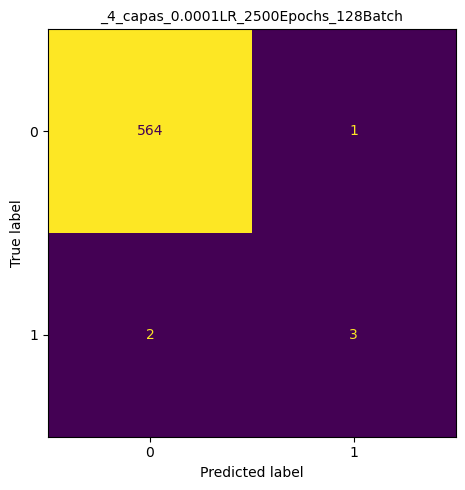

In [69]:
# Confusion matrix
if len(cb_best) > 1:
    fig, ax = plt.subplots(int(len(cb_best)), 1, figsize=(10,len(cb_trained_models)/2))
    ax=ax.flatten()
    
    for i, b in enumerate(cb_best):
        cb_test_predicted = np.round(cb.predict(cb1_test, verbose=0),0)
        cm = confusion_matrix(test_labels, cb_test_predicted)
        
        ax[i].set_title(cb_best_path[i][23:-3], fontsize=10)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp = disp.plot(ax=ax[i], colorbar=False)

else:
    fig, ax = plt.subplots(1, 1, figsize=(10,5))
    
    cb_test_predicted = np.round(cb_best[0].predict(cb1_test, verbose=0),0)
    cm = confusion_matrix(test_labels, cb_test_predicted)
    
    ax.set_title(cb_best_path[0][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax, colorbar=False)

plt.tight_layout()

# Comparación de resultados <a class="anchor" id="6"></a>

## Mejores modelos <a class="anchor" id="6.1"></a>

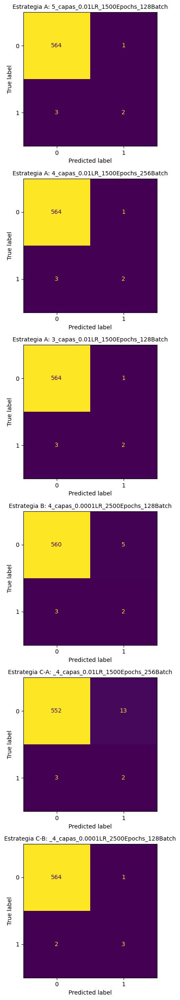

In [70]:
# Confusion matrix
total_models = len(a_best) + len(b_best) + len(ca_best) + len(cb_best)

fig, ax = plt.subplots(total_models, 1, figsize=(10,total_models*4))
ax=ax.flatten()
count = 0

for i,a in enumerate(a_best):
    a_test_predicted = np.round(a.predict(a_test, verbose=0),0)
    cm = confusion_matrix(test_labels, a_test_predicted)
    
    ax[count].set_title('Estrategia A: ' + a_best_path[i][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax[count], colorbar=False)
    count += 1

for i,b in enumerate(b_best):
    b_test_predicted = np.round(b.predict(b1_test, verbose=0),0)
    cm = confusion_matrix(test_labels, b_test_predicted)
    
    ax[count].set_title('Estrategia B: ' + b_best_path[i][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax[count], colorbar=False)
    count += 1

for i,ca in enumerate(ca_best):
    ca_test_predicted = np.round(ca.predict(ca_test, verbose=0),0)
    cm = confusion_matrix(test_labels, ca_test_predicted)
    
    ax[count].set_title('Estrategia C-A: ' + ca_best_path[i][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax[count], colorbar=False)
    count += 1

for i,cb in enumerate(cb_best):
    cb_test_predicted = np.round(cb.predict(cb1_test, verbose=0),0)
    cm = confusion_matrix(test_labels, cb_test_predicted)
    
    ax[count].set_title('Estrategia C-B: ' + cb_best_path[i][23:-3], fontsize=10)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp = disp.plot(ax=ax[count], colorbar=False)
    count += 1

plt.tight_layout()

In [71]:
print("\033[1m--- ESTRATEGIA A ---\033[0m")
for i, a in enumerate(a_best):
    a_test_predicted = np.round(a.predict(a_test, verbose=0),0)
    
    print("MODELO: \033[1m{}\033[0m".format(a_best_path[i][23:-3]))
    print("Accuracy:\t\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,a_test_predicted)*100))
    print("Precision:\t\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,a_test_predicted)*100))
    print("Recall:\t\t\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,a_test_predicted)*100))
    print("F1 Score:\t\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,a_test_predicted)*100))

print("\033[1m--- ESTRATEGIA B ---\033[0m")
for i, b in enumerate(b_best):
    b_test_predicted = np.round(b.predict(b1_test, verbose=0),0)
    
    print("MODELO: \033[1m{}\033[0m".format(b_best_path[i][23:-3]))
    print("Accuracy:\t\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,b_test_predicted)*100))
    print("Precision:\t\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,b_test_predicted)*100))
    print("Recall:\t\t\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,b_test_predicted)*100))
    print("F1 Score:\t\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,b_test_predicted)*100))

print("\033[1m--- ESTRATEGIA C-A ---\033[0m")
for i, a in enumerate(ca_best):
    ca_test_predicted = np.round(a.predict(ca_test, verbose=0),0)
    
    print("MODELO: \033[1m{}\033[0m".format(ca_best_path[i][23:-3]))
    print("Accuracy:\t\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,ca_test_predicted)*100))
    print("Precision:\t\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,ca_test_predicted)*100))
    print("Recall:\t\t\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,ca_test_predicted)*100))
    print("F1 Score:\t\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,ca_test_predicted)*100))

print("\033[1m--- ESTRATEGIA C-B ---\033[0m")
for i, b in enumerate(cb_best):
    cb_test_predicted = np.round(b.predict(cb1_test, verbose=0),0)
    
    print("MODELO: \033[1m{}\033[0m".format(cb_best_path[i][23:-3]))
    print("Accuracy:\t\033[1m{:.1f}%\033[0m".format(accuracy_score(test_labels,cb_test_predicted)*100))
    print("Precision:\t\033[1m{:.1f}%\033[0m".format(precision_score(test_labels,cb_test_predicted)*100))
    print("Recall:\t\t\033[1m{:.1f}%\033[0m".format(recall_score(test_labels,cb_test_predicted)*100))
    print("F1 Score:\t\033[1m{:.1f}%\033[0m\n".format(f1_score(test_labels,cb_test_predicted)*100))

--- ESTRATEGIA A ---
MODELO: 5_capas_0.01LR_1500Epochs_128Batch
Accuracy:	99.3%
Precision:	66.7%
Recall:		40.0%
F1 Score:	50.0%

MODELO: 4_capas_0.01LR_1500Epochs_256Batch
Accuracy:	99.3%
Precision:	66.7%
Recall:		40.0%
F1 Score:	50.0%

MODELO: 3_capas_0.01LR_1500Epochs_128Batch
Accuracy:	99.3%
Precision:	66.7%
Recall:		40.0%
F1 Score:	50.0%

--- ESTRATEGIA B ---
MODELO: 4_capas_0.0001LR_2500Epochs_128Batch
Accuracy:	98.6%
Precision:	28.6%
Recall:		40.0%
F1 Score:	33.3%

--- ESTRATEGIA C-A ---
MODELO: _4_capas_0.01LR_1500Epochs_256Batch
Accuracy:	97.2%
Precision:	13.3%
Recall:		40.0%
F1 Score:	20.0%

--- ESTRATEGIA C-B ---
MODELO: _4_capas_0.0001LR_2500Epochs_128Batch
Accuracy:	99.5%
Precision:	75.0%
Recall:		60.0%
F1 Score:	66.7%

